<a href="https://colab.research.google.com/github/savinats/LCPb-Project/blob/main/Next_Token_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [32]:
from transformers import GPT2LMHeadModel, GPT2Tokenizer, GPT2Model
import transformers
import sklearn.manifold
import numpy as np
import matplotlib.pyplot as plt
import torch
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

In [33]:
#Load pre-trained model and tokenizer
tokenizer = GPT2Tokenizer.from_pretrained("gpt2")
model = GPT2LMHeadModel.from_pretrained("gpt2")

In [34]:
#Encode text
input_text = "Pancakes are great for "
input_ids = tokenizer.encode(input_text, return_tensors="pt")
tokenized_input = tokenizer.encode(input_text, add_special_tokens=False)

In [35]:
#Generate text
output_ids = input_ids #initialize
num_tokens = len(tokenized_input)
print(f"Number of tokens in the input sentence: {num_tokens}")
print([tokenizer.decode(i)+" " for i in tokenized_input])

Number of tokens in the input sentence: 7
['P ', 'anc ', 'akes ', ' are ', ' great ', ' for ', '  ']


**Generated text**

In [36]:
#Decode and print the final generated text
#setting the parameters
max_length = 75
do_sample = True            # enable sampling to be able to change the following parameters
top_k = 50                  # considers only the top k most probable next tokens
top_p = 0.95                # it dynamically chooses the number of tokens to consider, based on their cumulative probability.
temperature = 0.7           # controls the randomness of predictions; applies temp before softmax. T<1: model more deterministic, T>1: output's more random + diverse
repetition_penalty = 1.1    # encourages more diverse output

attention_mask = torch.ones(input_ids.shape, dtype=torch.long)

#output = model.generate(input_ids, max_length = 100)
output = model.generate(
    input_ids,
    attention_mask = attention_mask,
    max_length=75,
    pad_token_id=tokenizer.eos_token_id, # the eos token_id default is 50256 (like the warning said)
    do_sample=True,
    top_k=50,
    top_p=0.95,
    temperature=0.8,
    repetition_penalty=1.1
)
text_output = tokenizer.decode(output[0], skip_special_tokens=True)

print(f"\n*Input text: {input_text}")
print(f"*Generated text: {text_output}")

#not complete answer????


*Input text: Pancakes are great for 
*Generated text: Pancakes are great for iced tea but not very popular with me. As a side note, I do like the flavor of coffee on pancakes in general - they're more creamy and chewy than most other types of cuppa's.
Ingredients: 1 cup heavy cream 2 tbsp coconut flour 4 eggs (I used one) 3 tsp vanilla extract 5 tbs


**Token by token selection:**

The vocabulary dimension contains the logits for each token (voc size of gpt2 is 50257)

Logits are the output of the final layer before softmax and they represent unormalized scores or probabilities

In [37]:
for _ in range(max_length - len(input_ids[0])):
  outputs = model(output_ids, output_attentions=True)

  logits = outputs.logits[:,-1,:] #batch_size, sequence_length, vocab_size
  probs = torch.softmax(logits, dim=-1) #softmax func to convert logits tensor to probabilities
  next_token_id = torch.argmax(probs, dim=-1).unsqueeze(-1) #selects token with highest prob from probs for each sequence

  print(f"**Logits for next possible token: {logits}")
  print(f"**Probabilities for next possible token: {probs}")
  print(f"**Next token ID: {next_token_id}")
  print(f"**Next token: {tokenizer.decode(next_token_id[0])}")

  #Append the next token to the input_ids
  output_ids = torch.cat([output_ids, next_token_id], dim=-1)

#Print attention weights
#for i, attn in enumerate(outputs.attentions):
#  print(f"Layer {i + 1} attention shape: {attn.shape}")
#  print(attn)
  # attn has shape [batch_size, num_heads, sequence_length, sequence_length]

`GPT2SdpaAttention` is used but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


**Logits for next possible token: tensor([[-61.7778, -63.3277, -64.3894,  ..., -71.3819, -69.9168, -64.6930]],
       grad_fn=<SliceBackward0>)
**Probabilities for next possible token: tensor([[1.0883e-05, 2.3102e-06, 7.9906e-07,  ..., 7.3412e-10, 3.1772e-09,
         5.8982e-07]], grad_fn=<SoftmaxBackward0>)
**Next token ID: tensor([[3711]])
**Next token: iced
**Logits for next possible token: tensor([[-101.4484, -103.3080, -110.3323,  ..., -112.3722, -108.0769,
         -104.6223]], grad_fn=<SliceBackward0>)
**Probabilities for next possible token: tensor([[1.0720e-04, 1.6695e-05, 1.4857e-08,  ..., 1.9321e-09, 1.4174e-07,
         4.4850e-06]], grad_fn=<SoftmaxBackward0>)
**Next token ID: tensor([[8887]])
**Next token:  tea
**Logits for next possible token: tensor([[-81.6065, -85.7650, -91.1106,  ..., -94.5603, -95.4727, -86.0810]],
       grad_fn=<SliceBackward0>)
**Probabilities for next possible token: tensor([[1.2766e-02, 1.9953e-04, 9.5162e-07,  ..., 3.0217e-08, 1.2135e-08,
    

**PLOTS FOR NEXT MOST PROBABLE TOKEN *WITHOUT*  USING THE MULTINOMIAL DISTRIBUTION & SAMPLING**

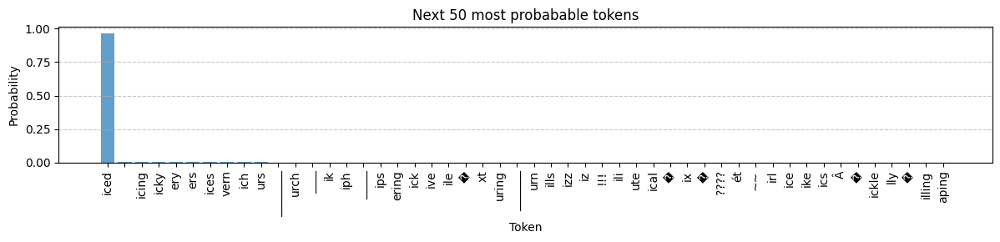

Generated so far: Pancakes are great for iced


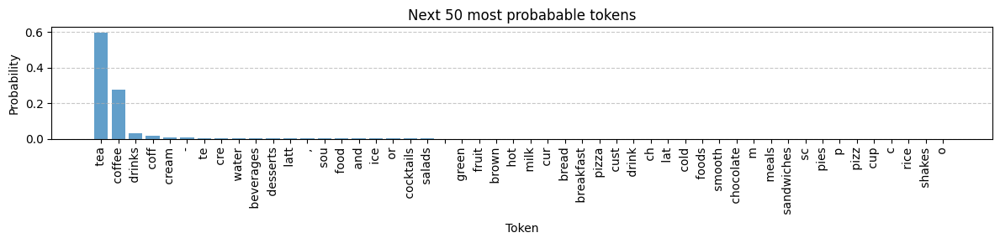

Generated so far: Pancakes are great for iced tea


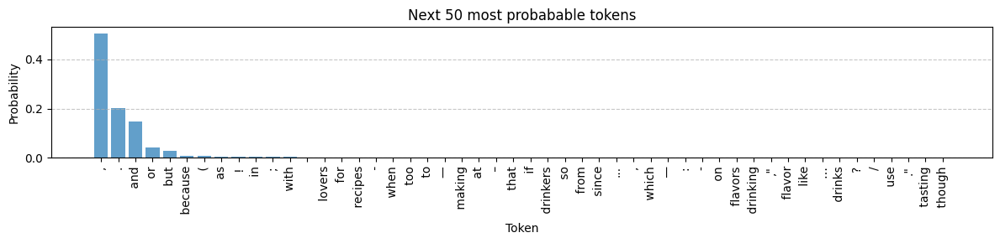

Generated so far: Pancakes are great for iced tea,


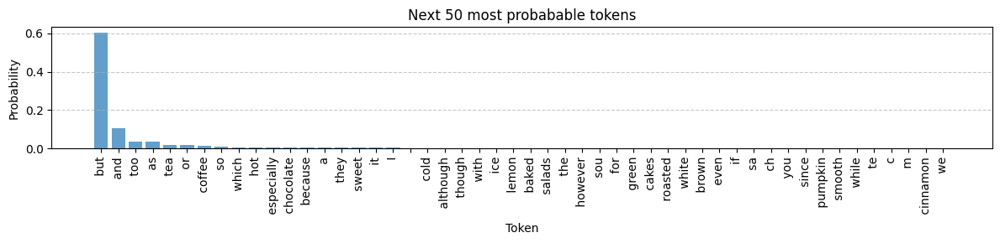

Generated so far: Pancakes are great for iced tea, but


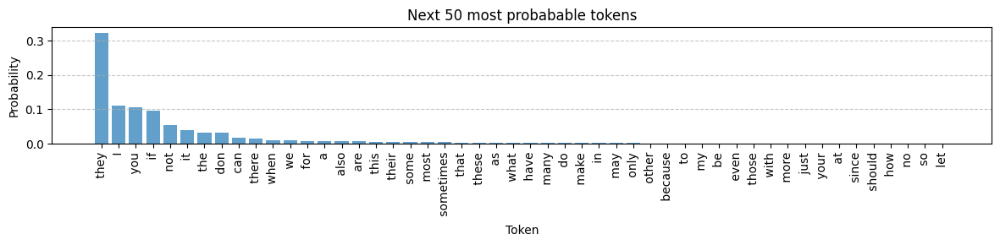

Generated so far: Pancakes are great for iced tea, but they


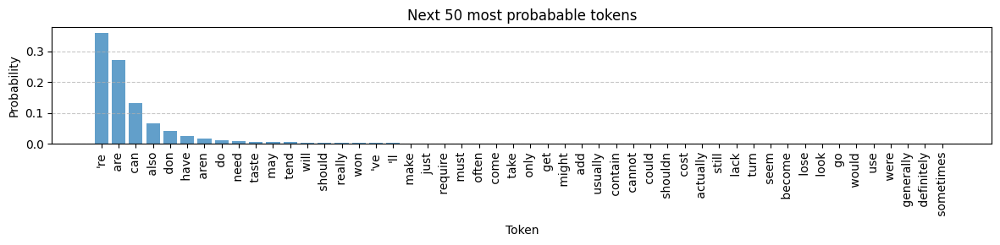

Generated so far: Pancakes are great for iced tea, but they're


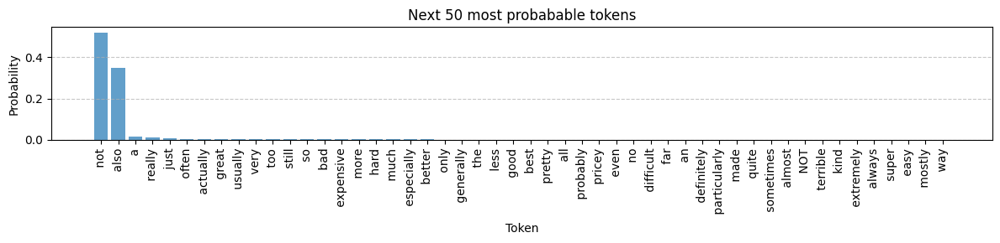

Generated so far: Pancakes are great for iced tea, but they're not


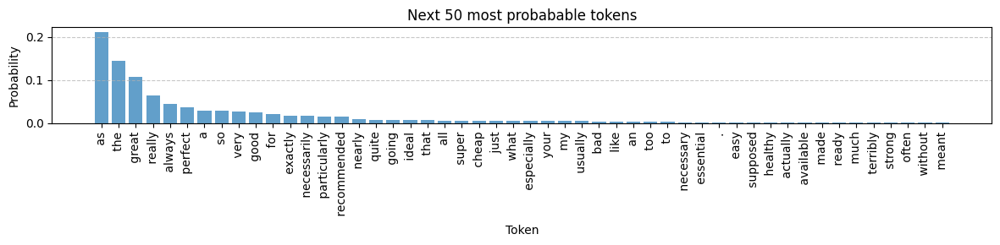

Generated so far: Pancakes are great for iced tea, but they're not as


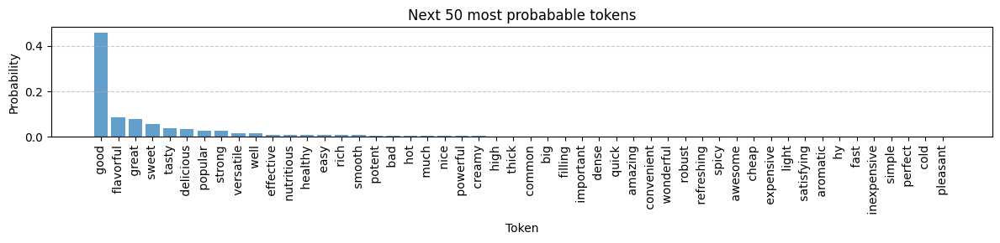

Generated so far: Pancakes are great for iced tea, but they're not as good


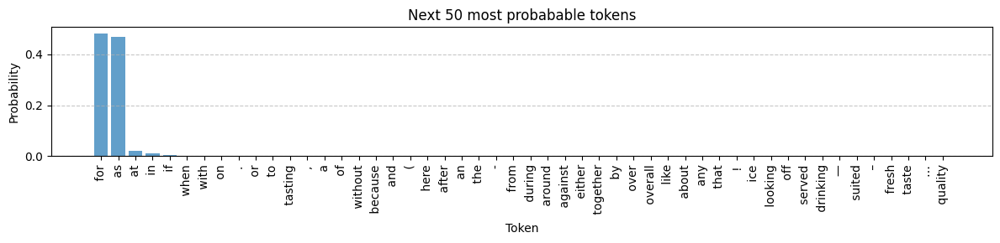

Generated so far: Pancakes are great for iced tea, but they're not as good for


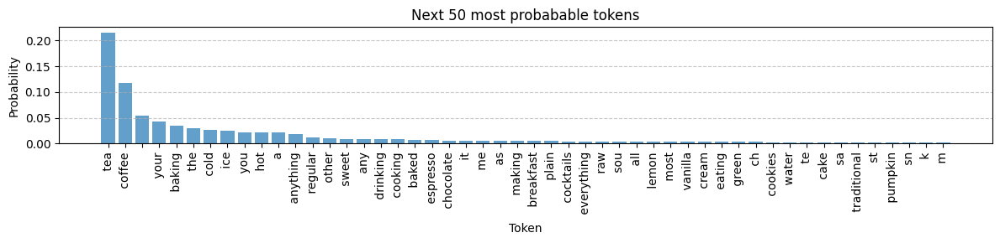

Generated so far: Pancakes are great for iced tea, but they're not as good for tea


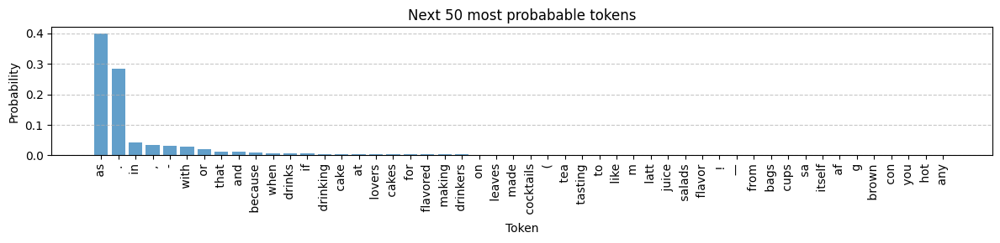

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as


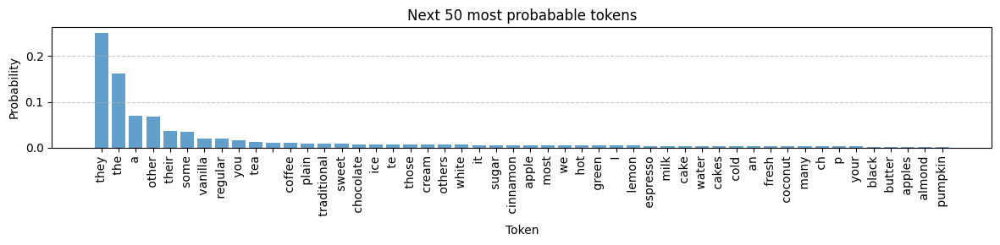

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they


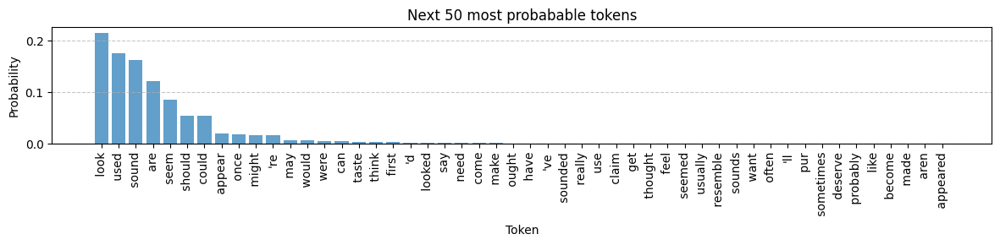

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look


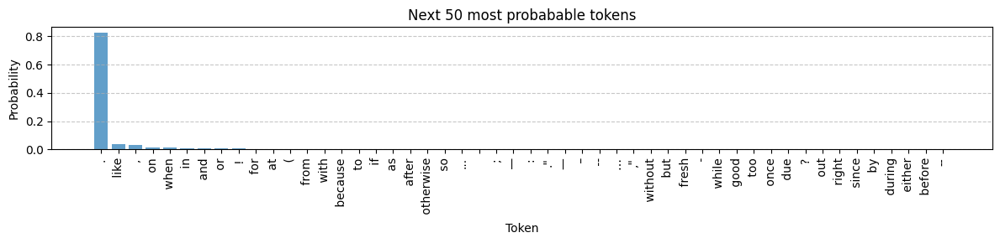

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.


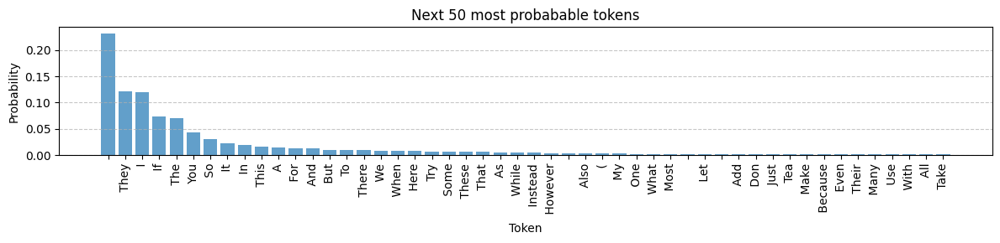

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.



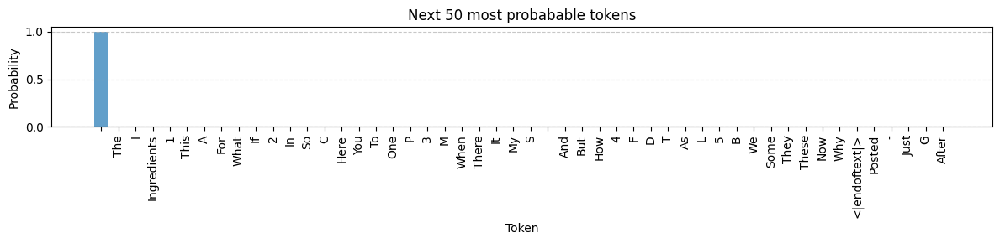

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.




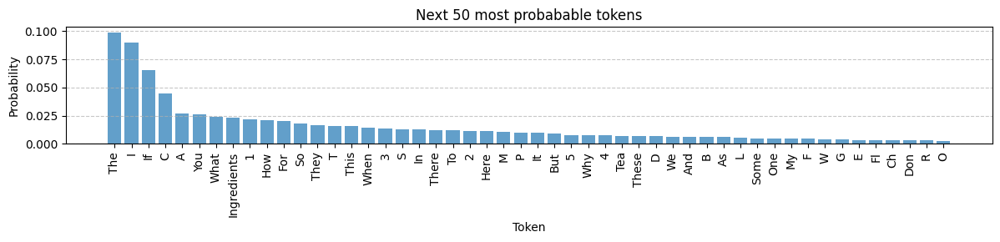

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The


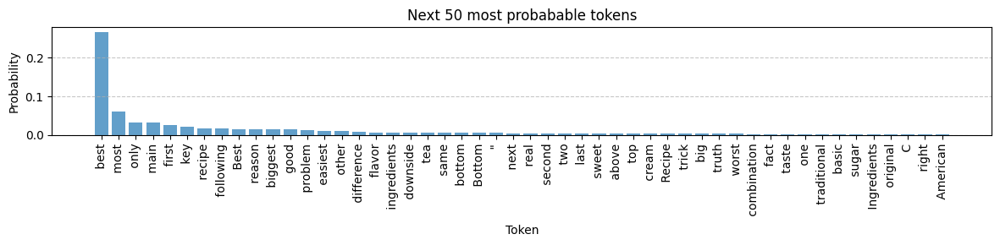

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best


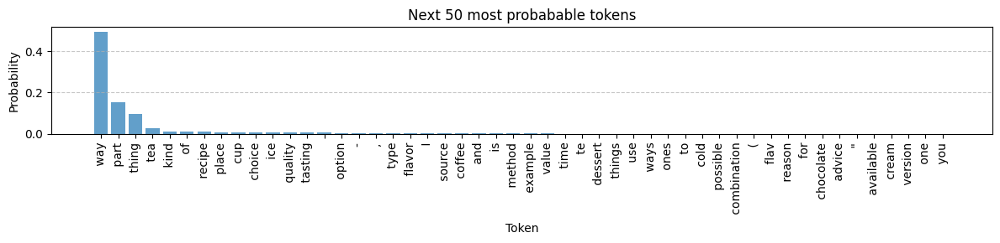

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way


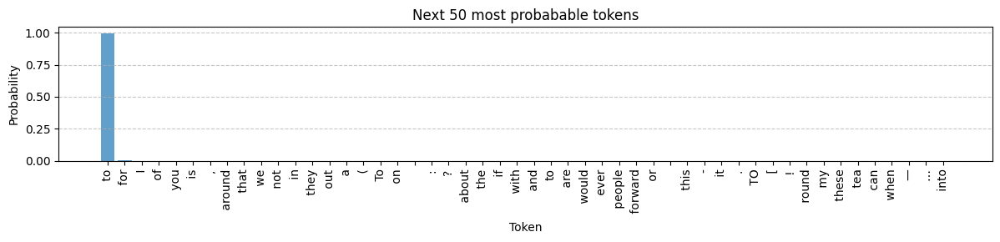

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to


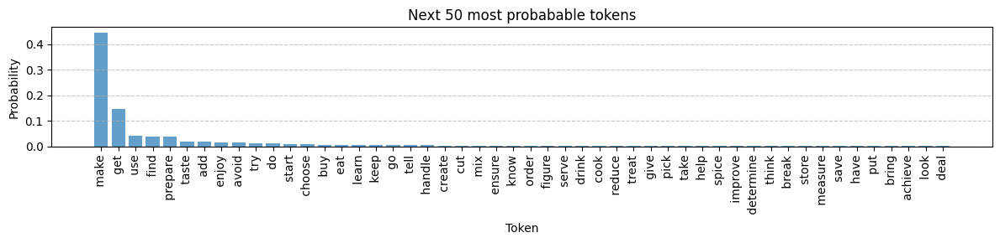

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make


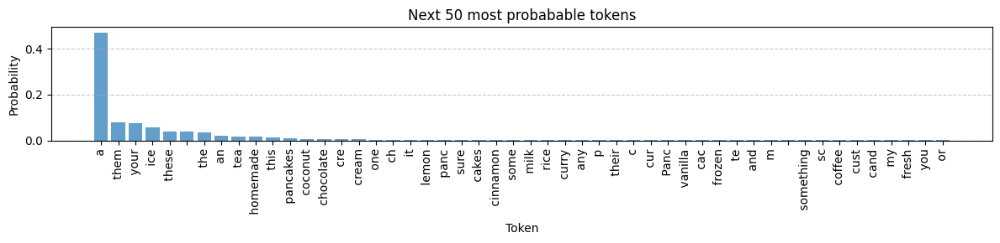

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a


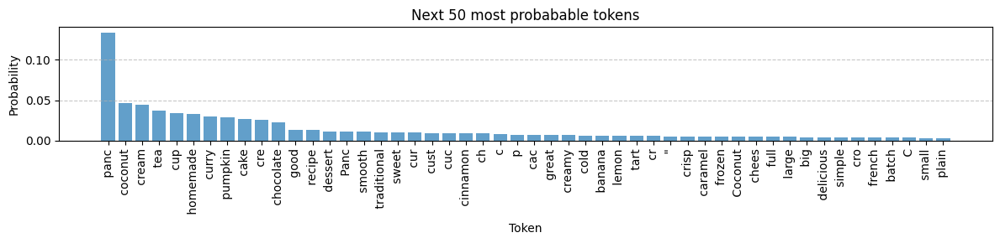

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a panc


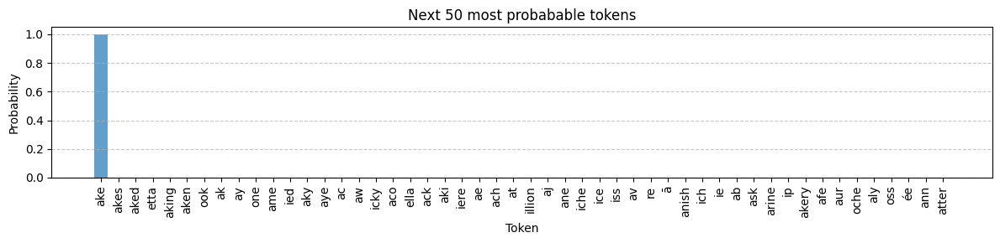

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake


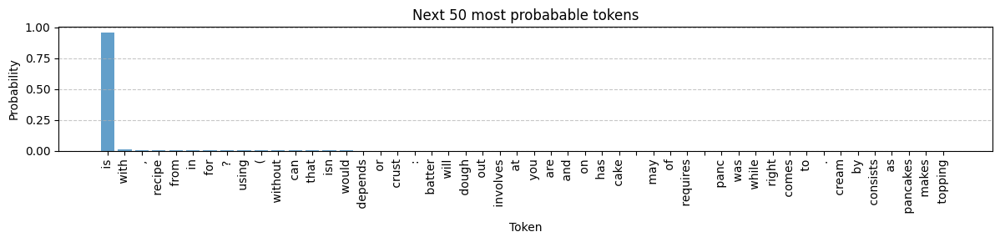

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is


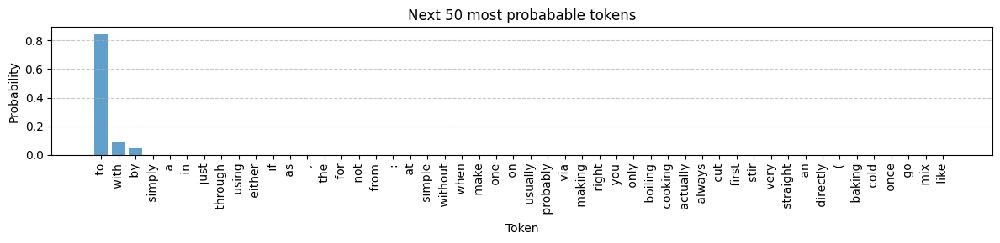

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to


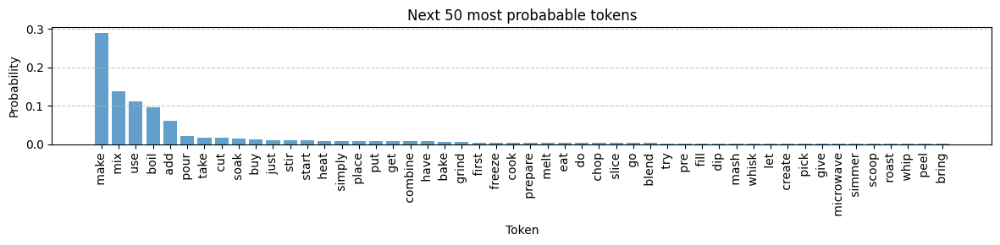

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make


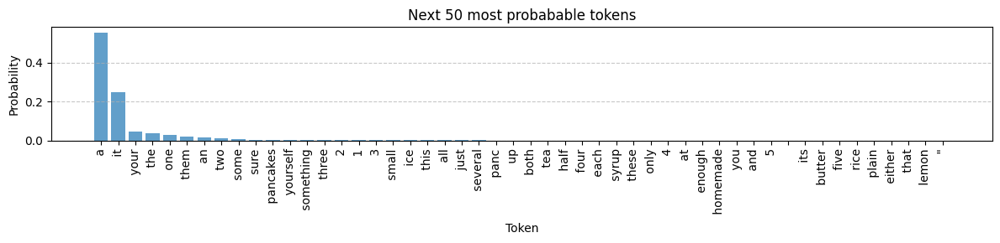

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a


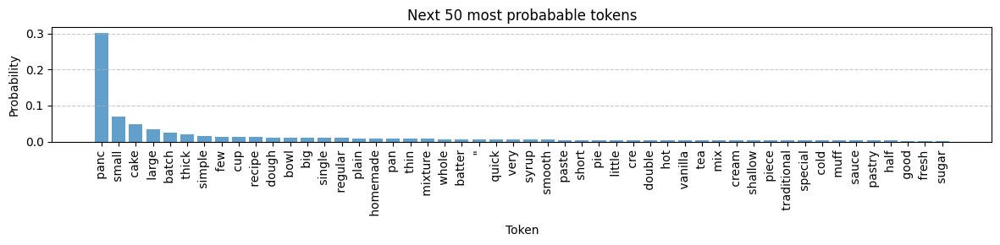

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a panc


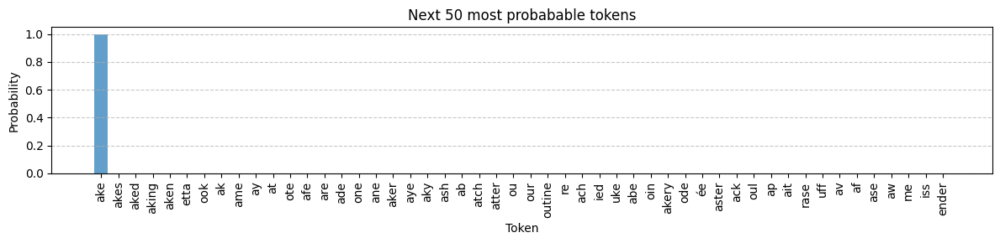

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake


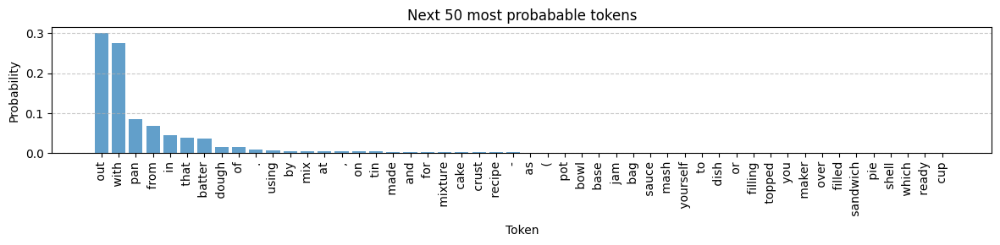

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out


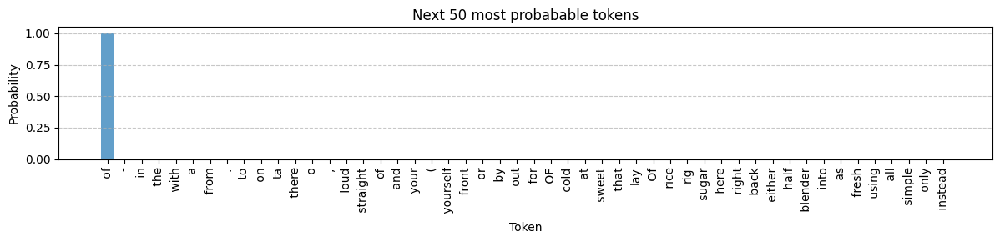

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of


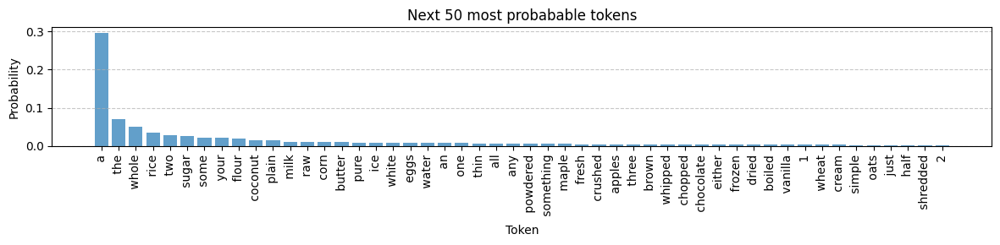

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a


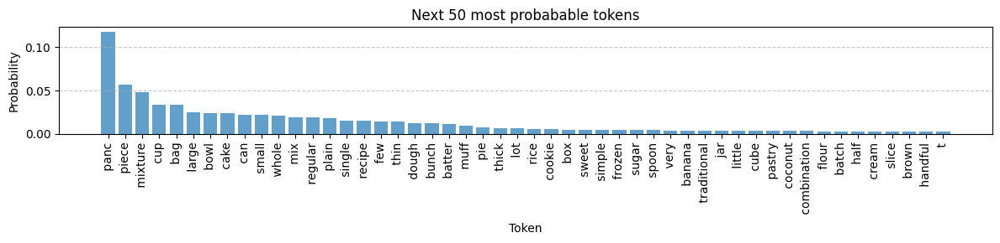

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a panc


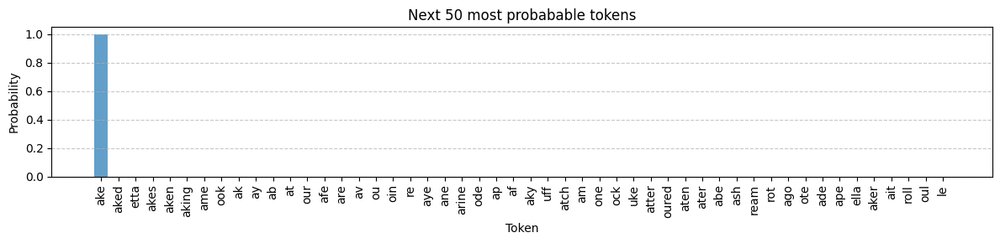

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake


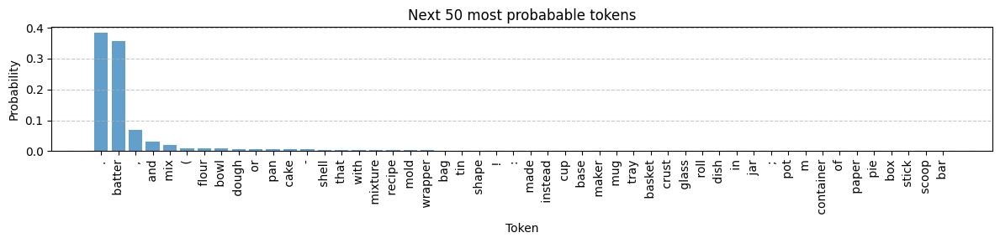

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.


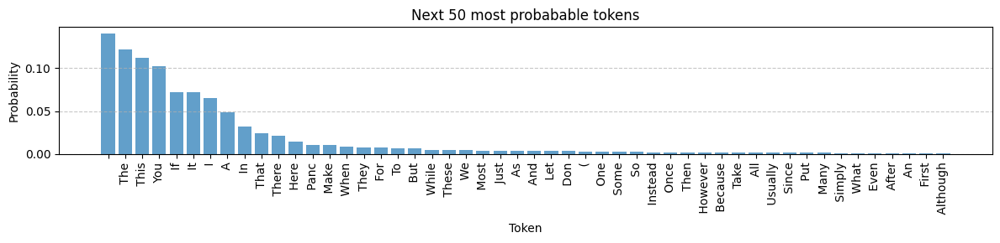

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.



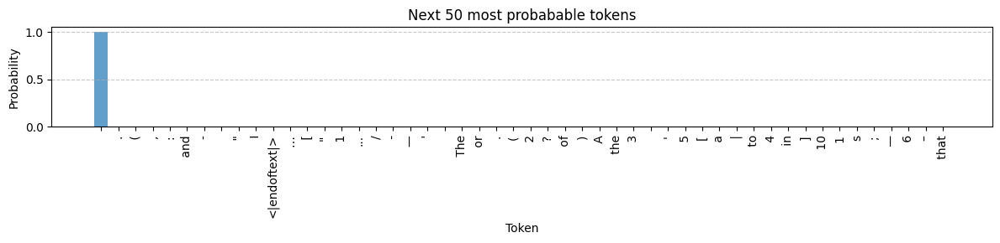

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.




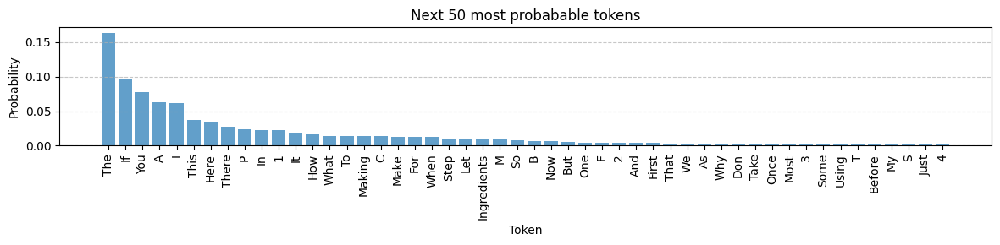

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The


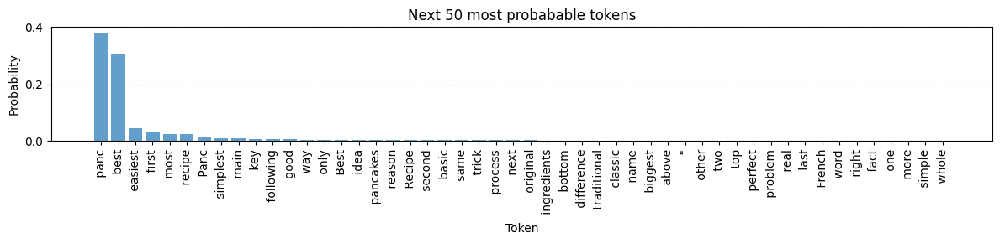

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The panc


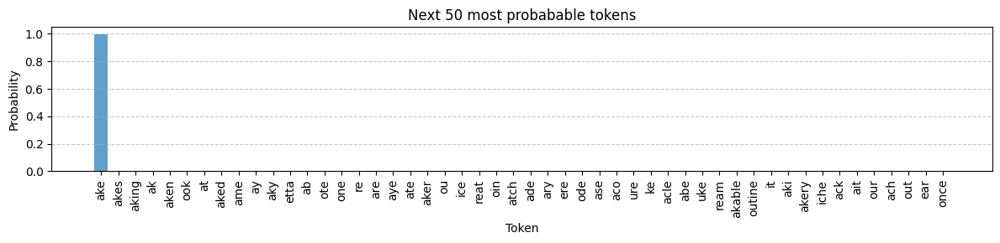

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake


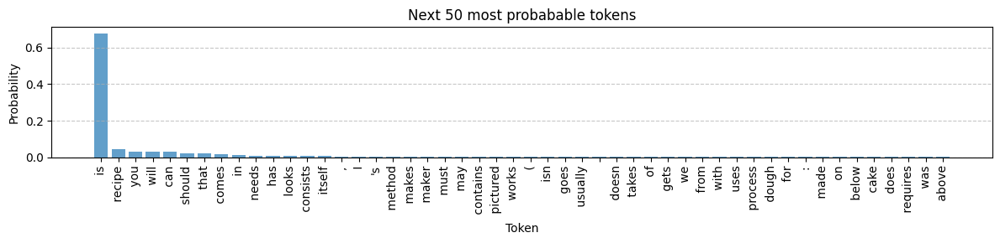

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is


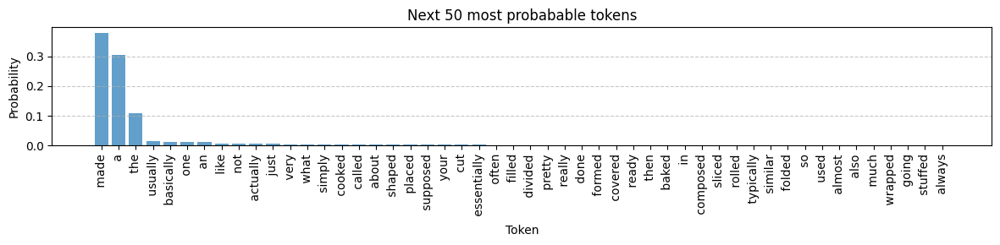

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made


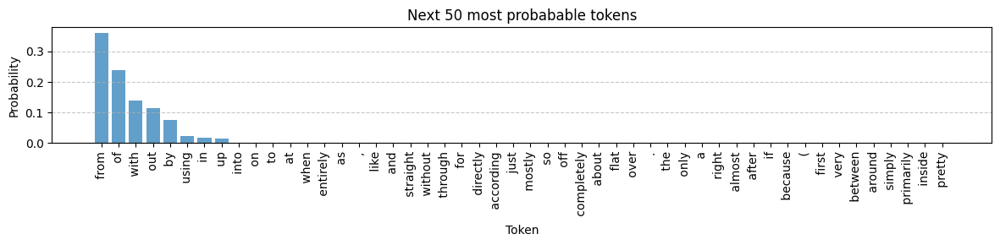

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from


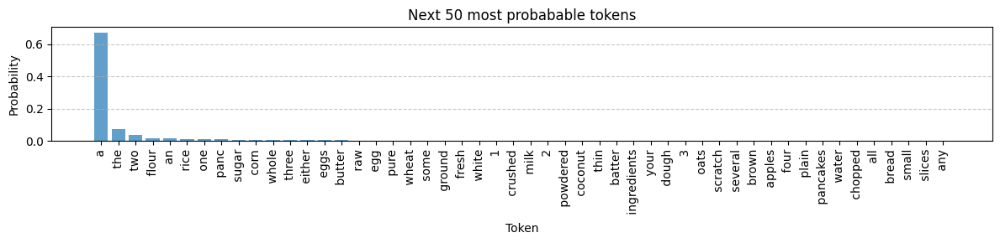

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a


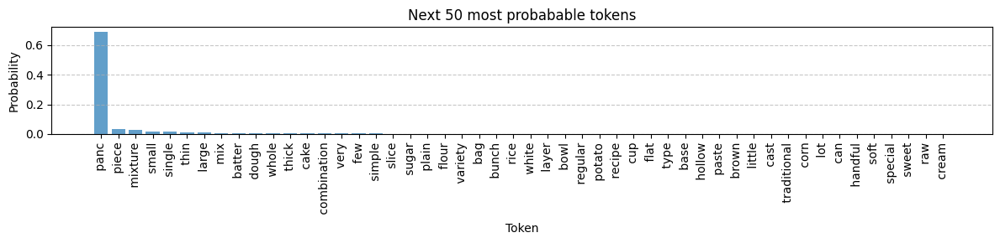

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a panc


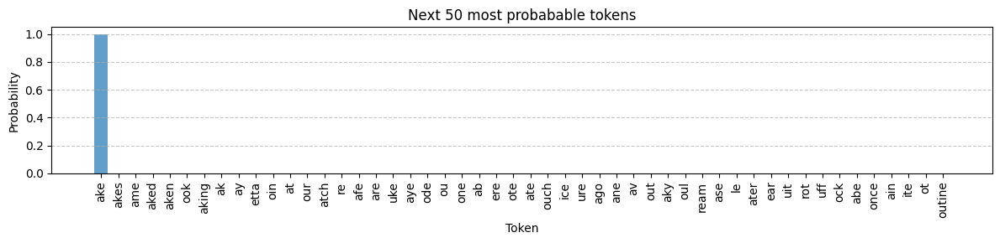

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake


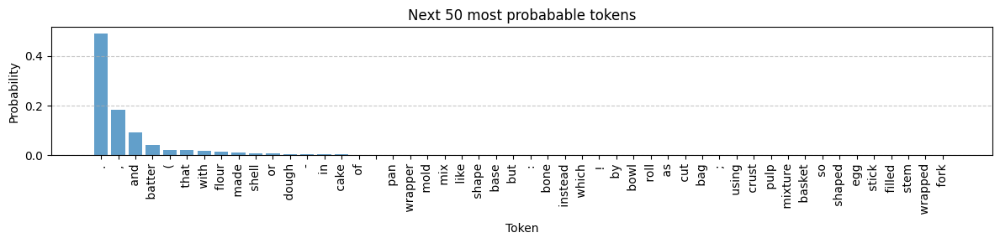

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.


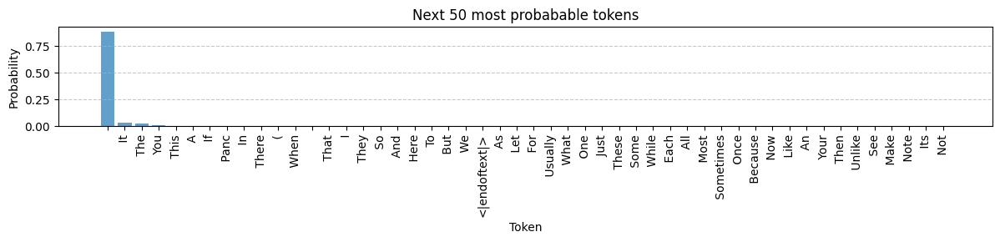

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.



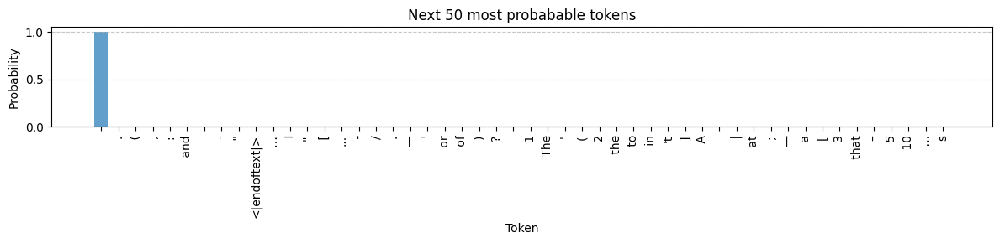

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.




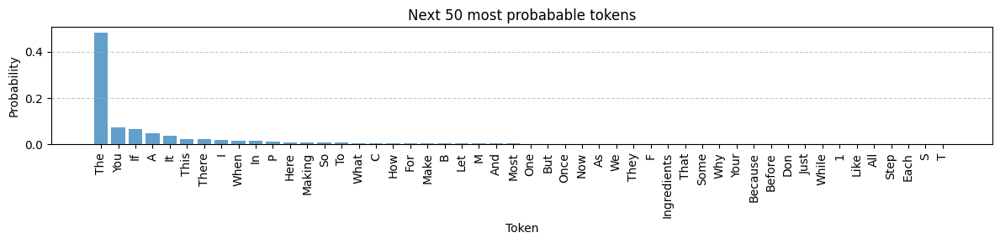

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The


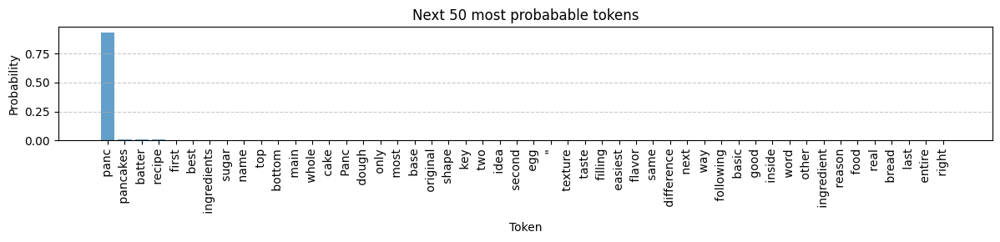

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The panc


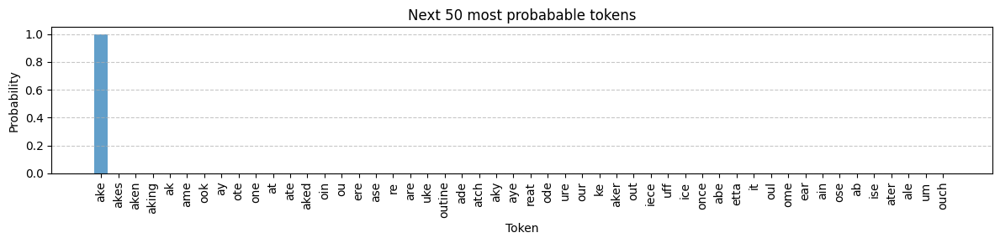

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake


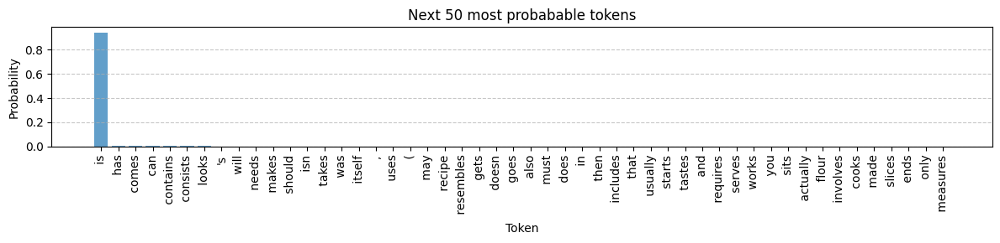

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is


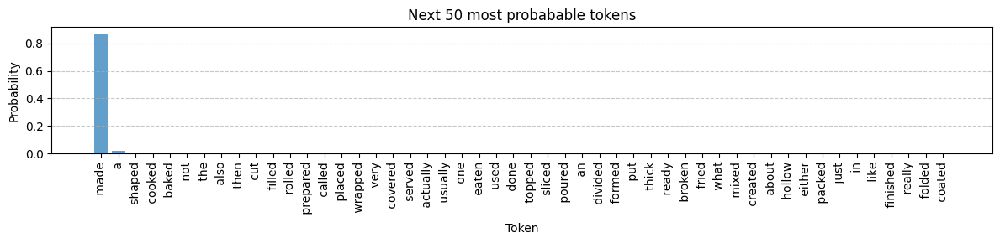

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made


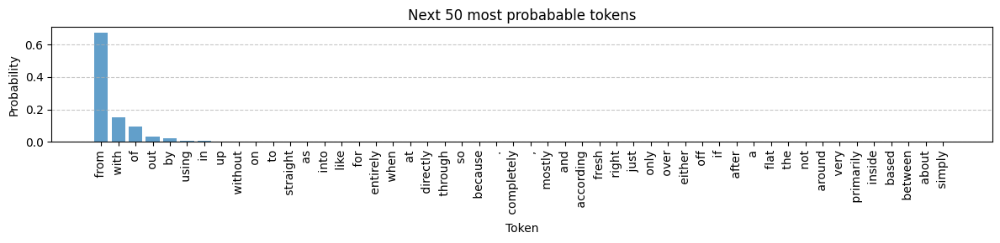

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from


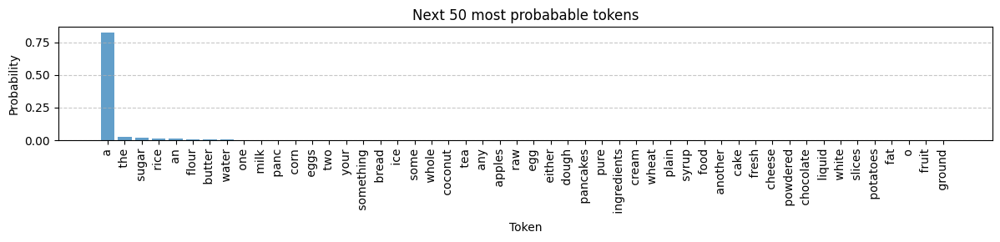

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a


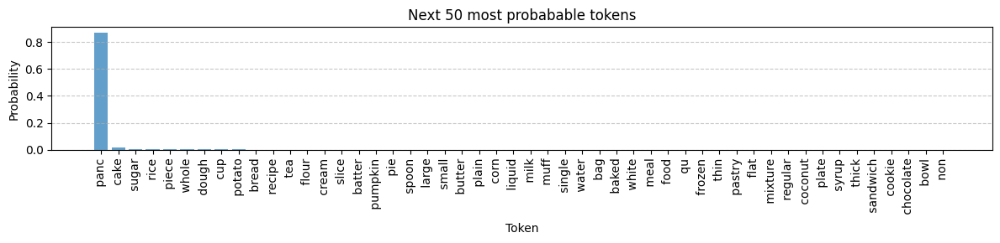

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a panc


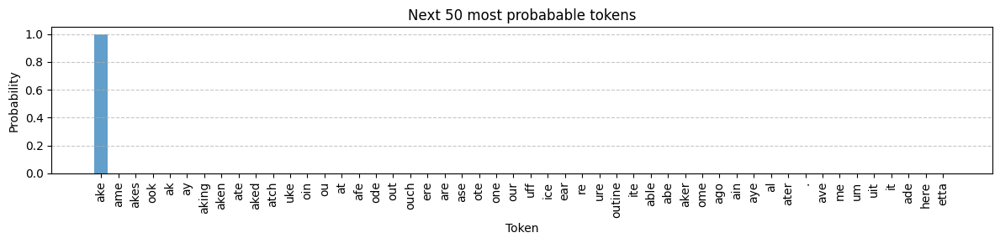

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a pancake


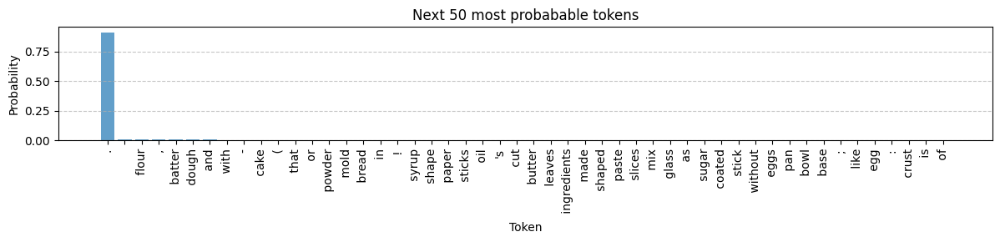

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a pancake.


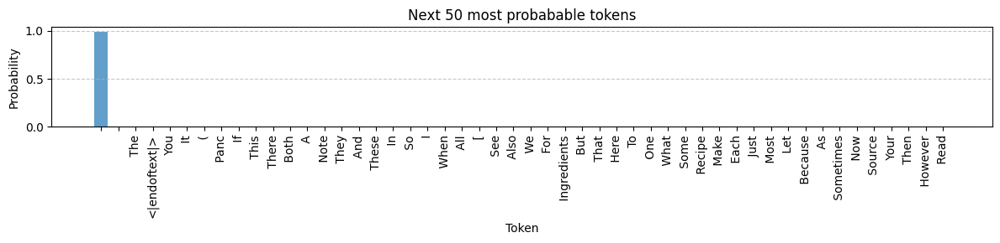

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a pancake.



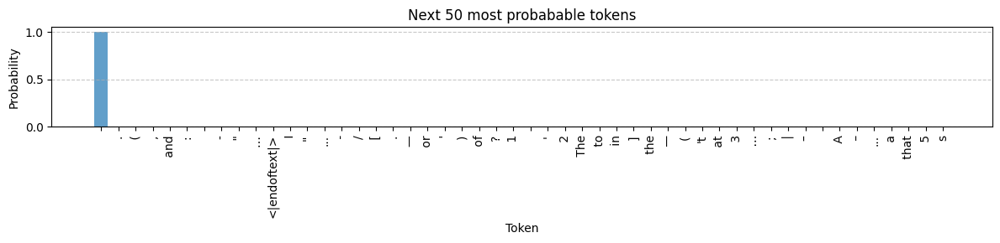

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a pancake.




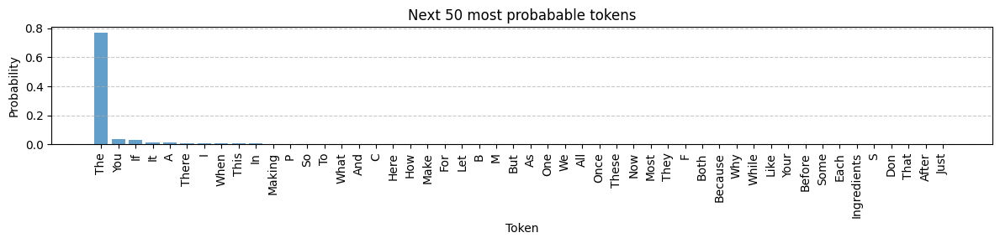

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a pancake.

The


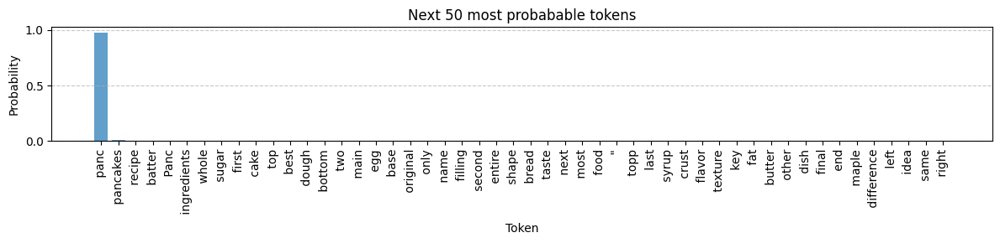

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a pancake.

The panc


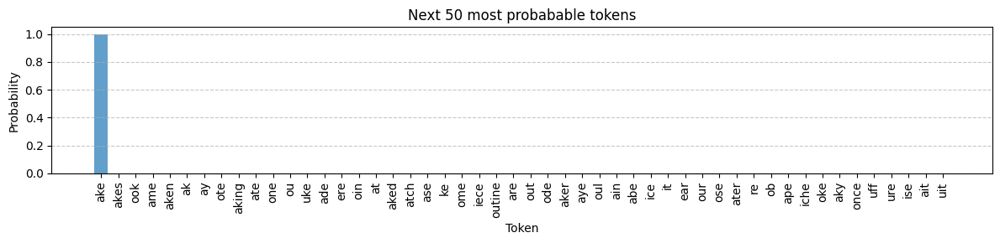

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a pancake.

The pancake


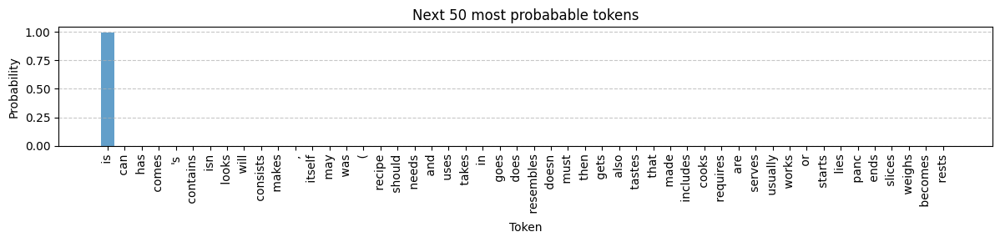

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a pancake.

The pancake is


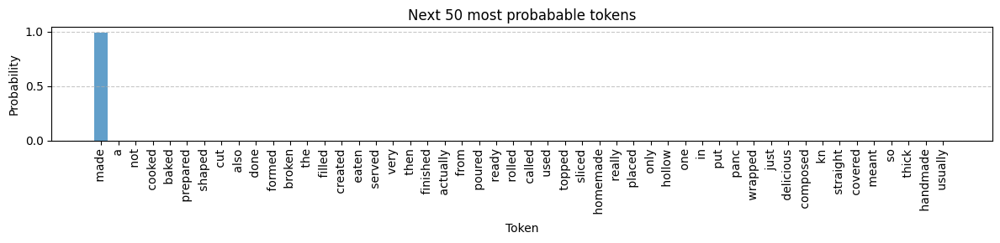

Generated so far: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a pancake.

The pancake is made
Input text: Pancakes are great for ...
**Final generated text: Pancakes are great for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake out of a pancake.

The pancake is made from a pancake.

The pancake is made from a pancake.

The pancake is made


In [38]:
# PLOTS FOR NEXT MOST PROBABLE TOKEN WITHOUT USING THE MULTINOMIAL DISTRIBUTION
# which means choosing the next generated token by looking at just the most probable one

for _ in range(max_length - len(input_ids[0])):

    # Pass the current input_ids through the model to get the logits
    with torch.no_grad():
        #outputs = model(input_ids)
        outputs = model(input_ids, attention_mask=torch.ones(input_ids.shape, dtype=torch.long))

    logits = outputs.logits[:, -1, :] # Get the logits for the last token\

    logits = logits / 0.7

    probs = torch.softmax(logits, dim=-1) # Convert logits to probabilities

    next_token_id = torch.argmax(probs, dim=-1).unsqueeze(-1) # Select the token with the highest probability

    input_ids = torch.cat([input_ids, next_token_id], dim=-1) # Append the selected token to the input sequence

    current_text = tokenizer.decode(input_ids[0], skip_special_tokens=True) # Decode the current state of the sequence and print it

    #Extract the top 50 probabilities and their indices
    #probs = torch.softmax(logits, dim=-1)
    top_probs, top_indices = torch.topk(probs, 50)

    #Convert to numpy for plotting
    #flatten() minimizes the dimensions of the tensor to 1
    top_probs_np = top_probs.detach().numpy().flatten()
    top_indices_np = top_indices.detach().numpy().flatten()

    #Decode the top indices to get their corresponding tokens

    top_tokens = [tokenizer.decode([idx]) for idx in top_indices_np]

    #Plotting them
    plt.figure(figsize=(12, 3))
    plt.bar(np.arange(50), top_probs_np, alpha=0.7)
    plt.xlabel('Token')
    plt.ylabel('Probability')
    plt.title('Next 50 most probabable tokens')
    plt.xticks(np.arange(50), top_tokens, rotation='vertical')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    print(f"Generated so far: {current_text}")

    #Stop if the model generates a special end-of-sequence token
    if next_token_id.item() == tokenizer.eos_token_id:
        break

final_text = tokenizer.decode(input_ids[0], skip_special_tokens=True)
print(f"Input text: {input_text}...")
print(f"**Final generated text: {final_text}")

**PROBABILITIES FOR NEXT MOST PROBABLE TOKEN *USING* THE MULTINOMIAL DISTRUBUTION & SAMPLING + TOTAL ENTROPY**

Seeing that the model has a bias towards choosing the same token over and over again, we try to avoid this by twitching the Temperature parameter. In order to do that, we use the multinomial distribution; the model chooses the next generated token based on a distribution of 50 most probable tokens.

<ipython-input-41-76fc54770f15>:74: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


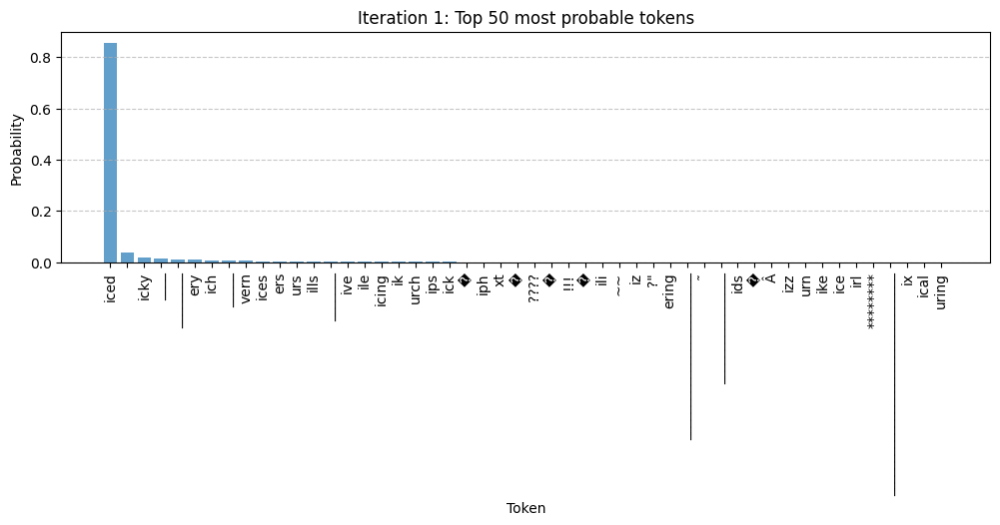

Generated so far: Pancakes are good for iced


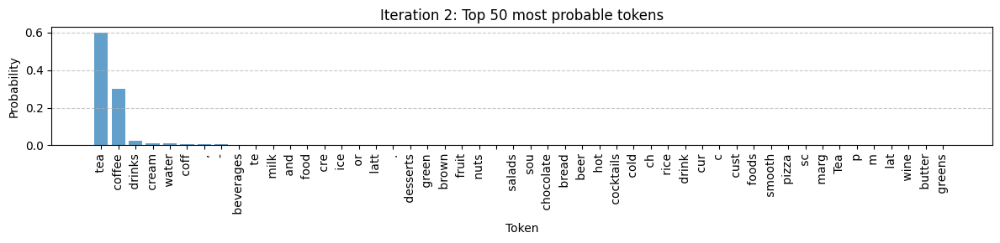

Generated so far: Pancakes are good for iced coffee


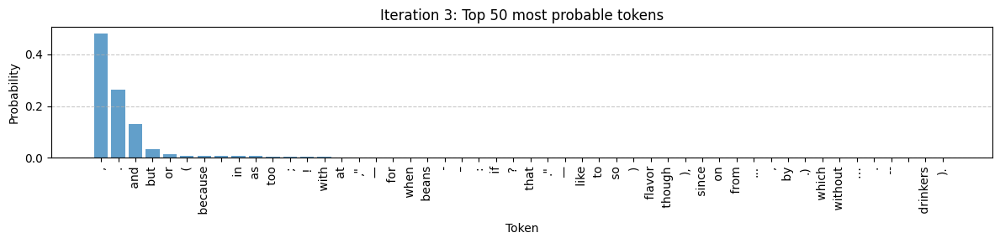

Generated so far: Pancakes are good for iced coffee.


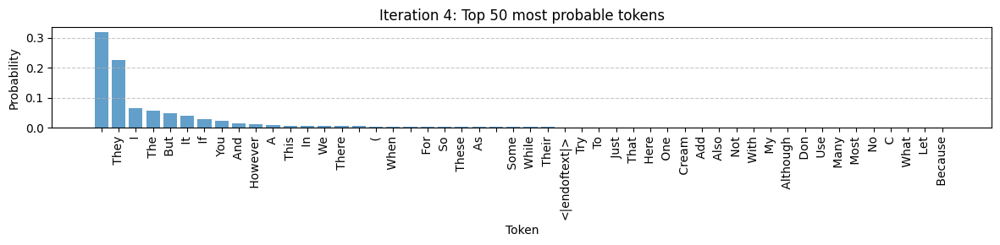

Generated so far: Pancakes are good for iced coffee. But


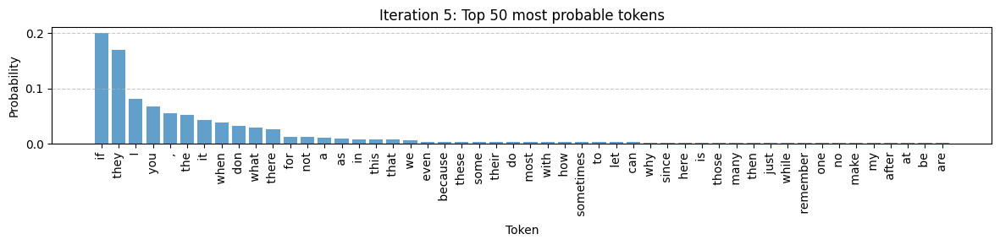

Generated so far: Pancakes are good for iced coffee. But,


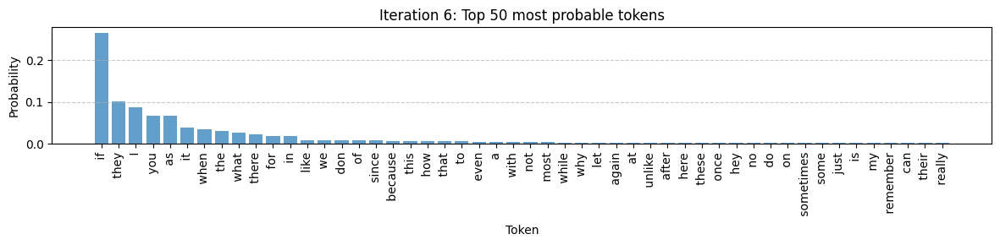

Generated so far: Pancakes are good for iced coffee. But, if


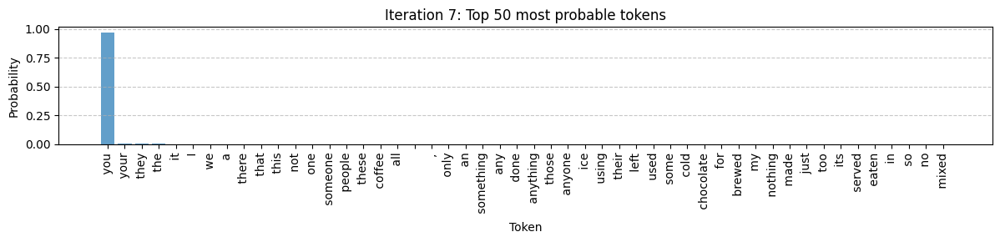

Generated so far: Pancakes are good for iced coffee. But, if you


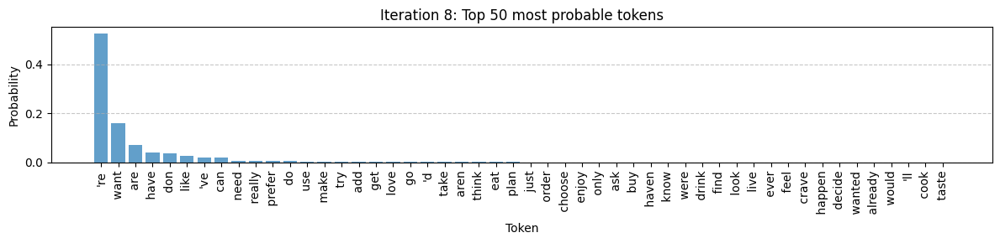

Generated so far: Pancakes are good for iced coffee. But, if you're


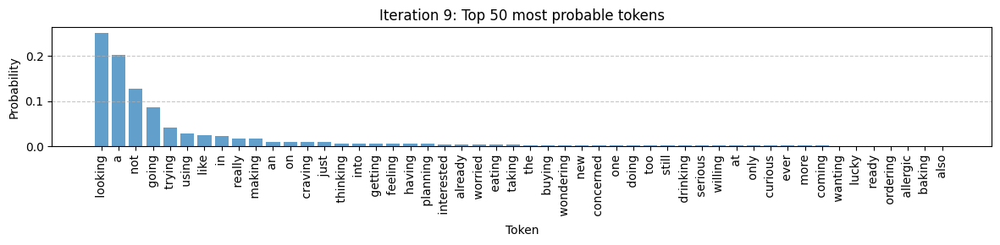

Generated so far: Pancakes are good for iced coffee. But, if you're not


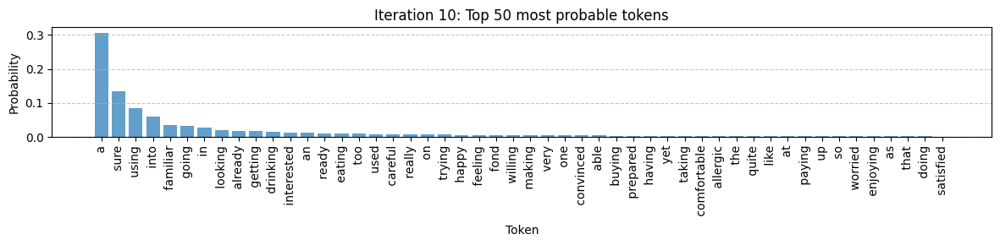

Generated so far: Pancakes are good for iced coffee. But, if you're not interested


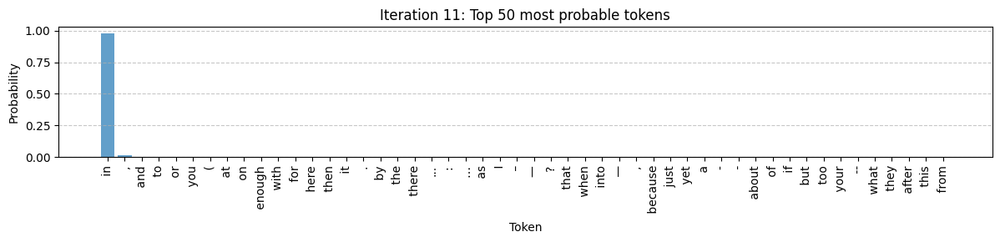

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in


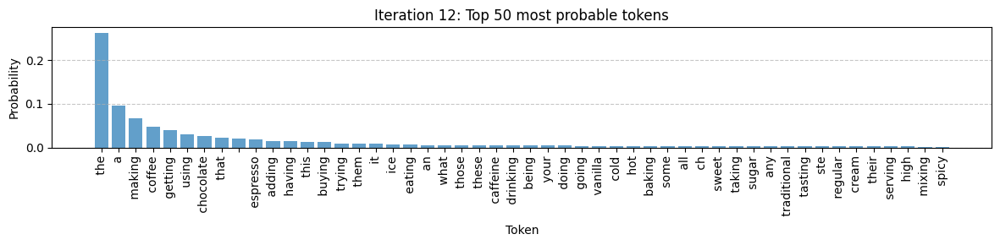

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the


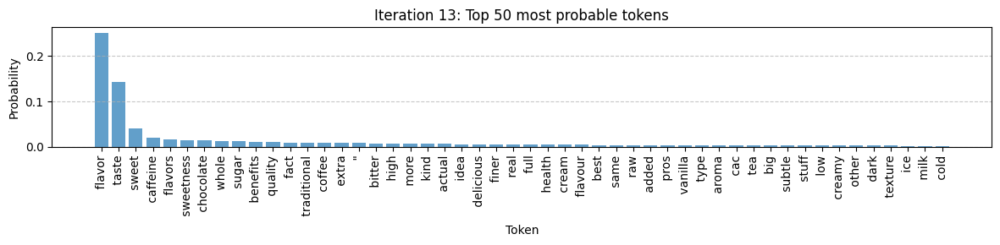

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor


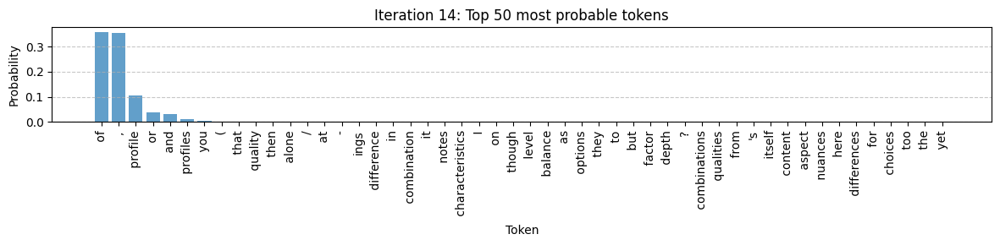

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile


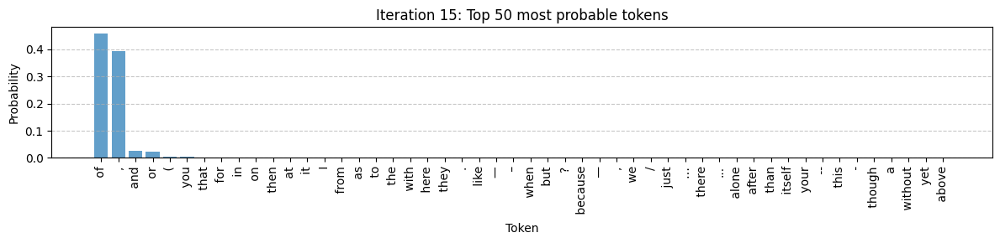

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of


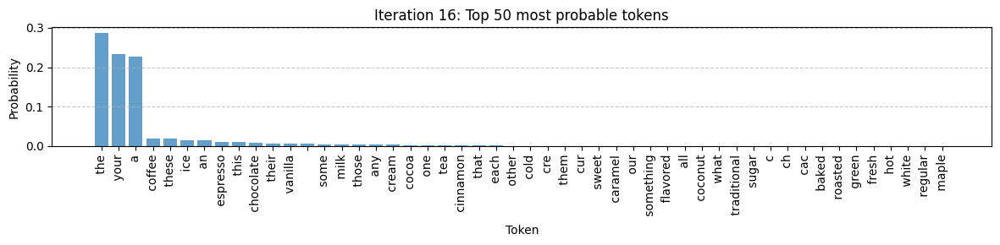

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an


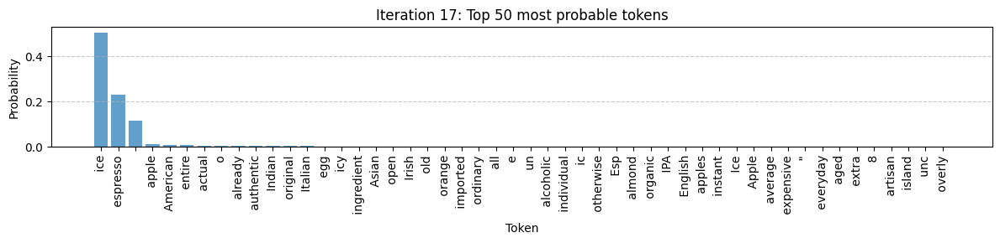

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice


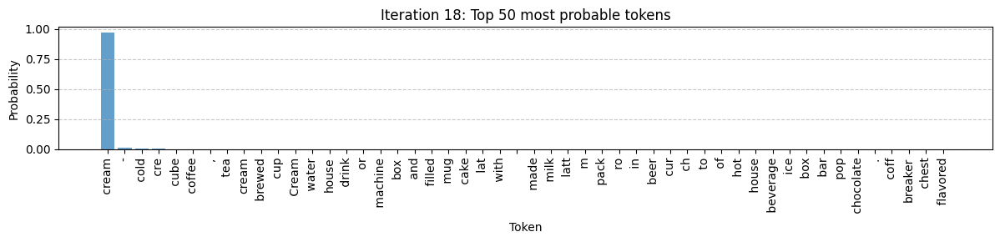

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream


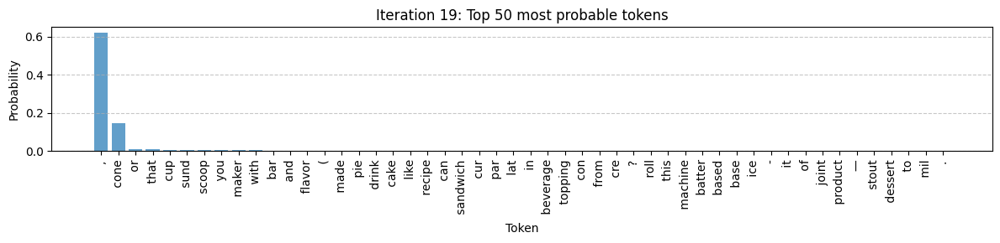

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone


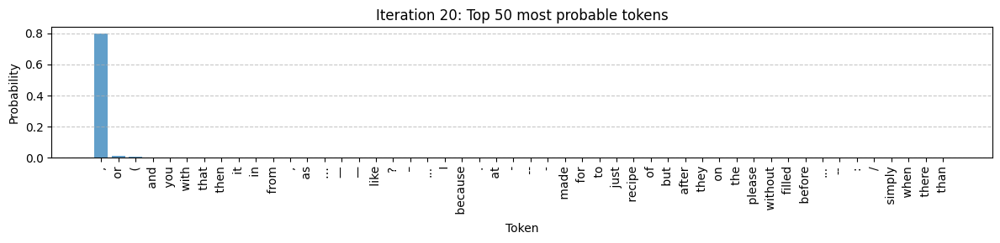

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone,


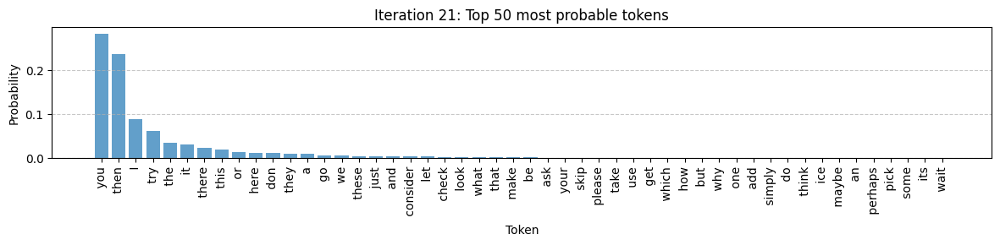

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then


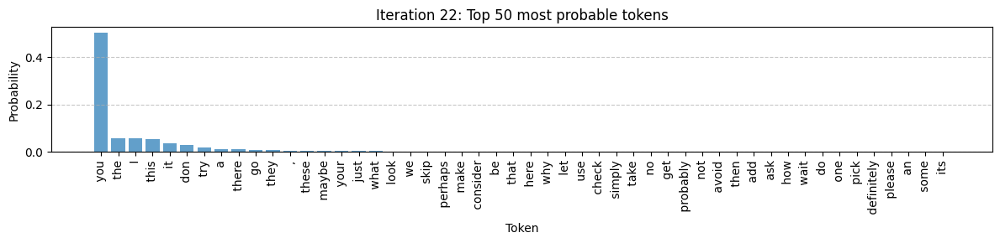

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you


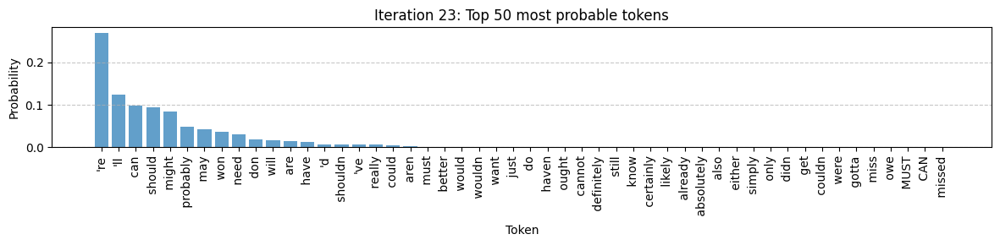

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably


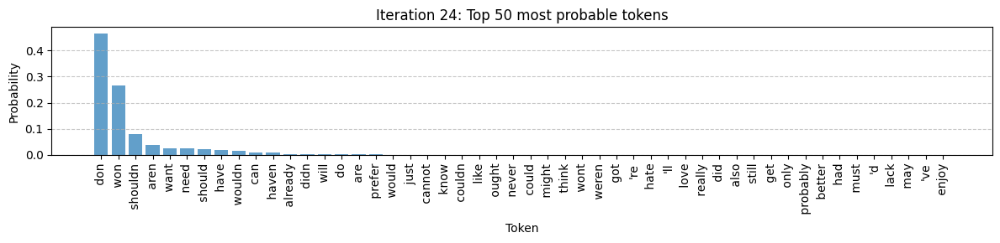

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don


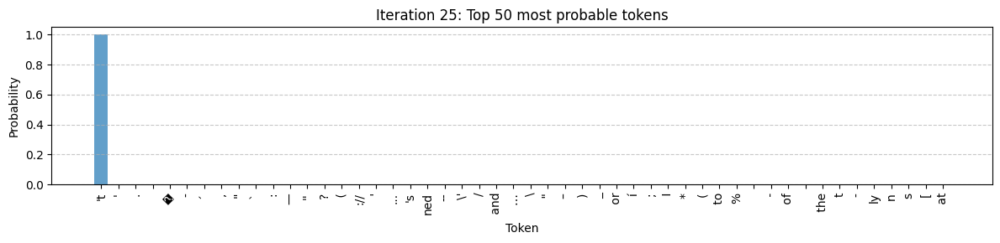

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't


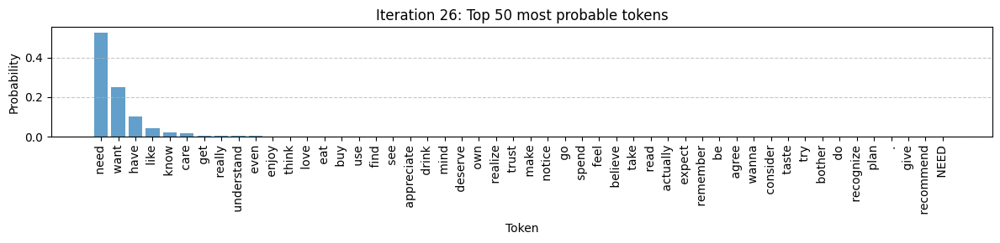

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like


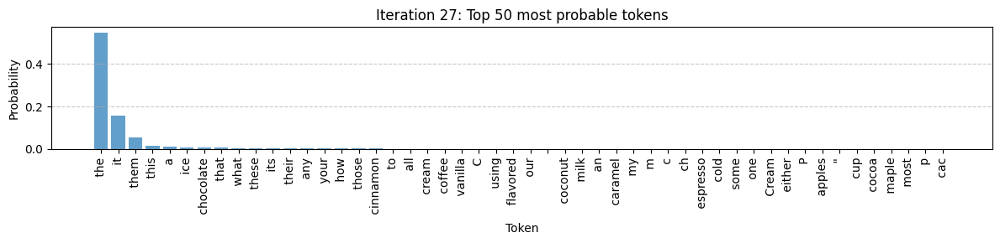

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it


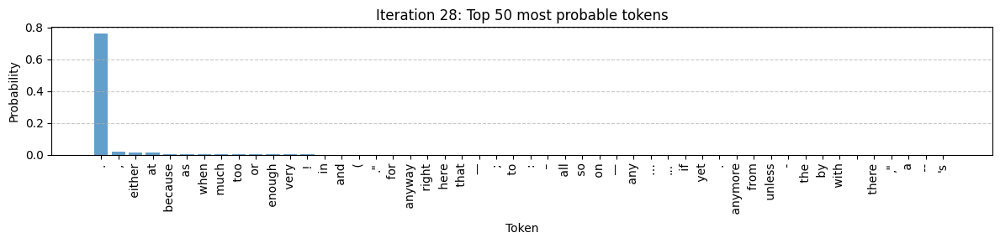

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as


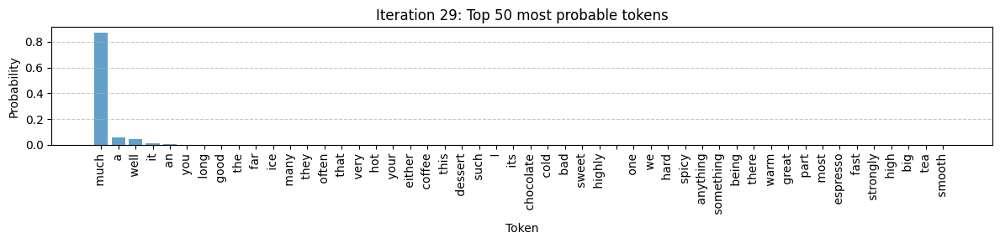

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much


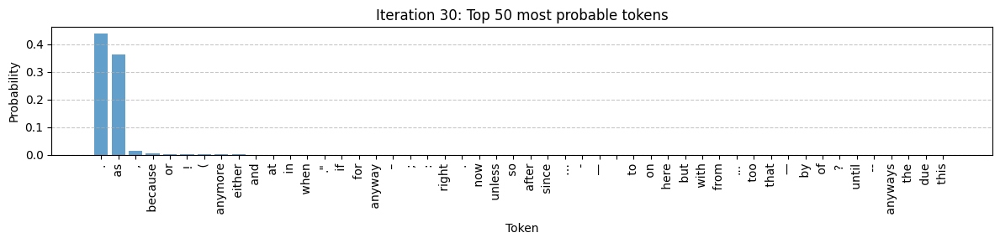

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.


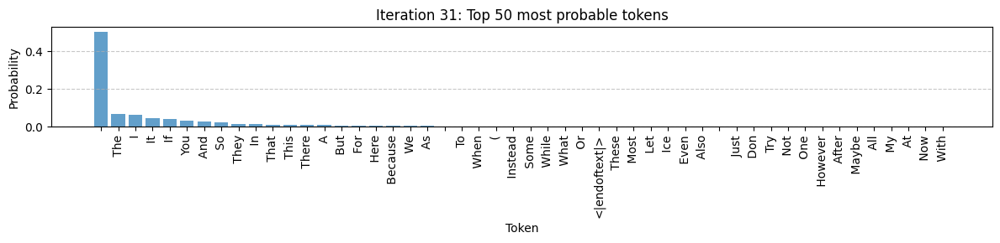

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.



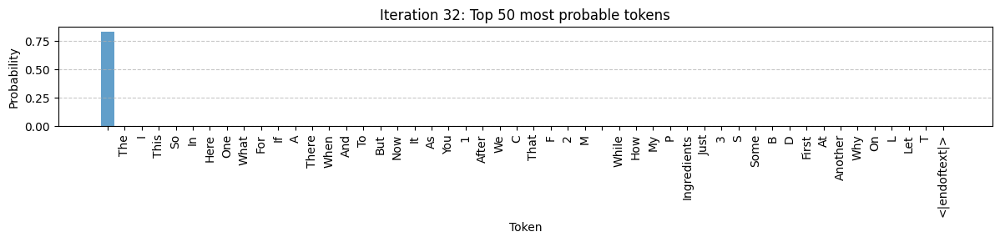

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.




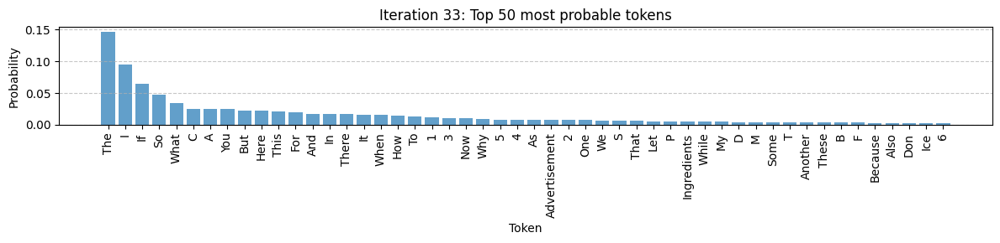

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When


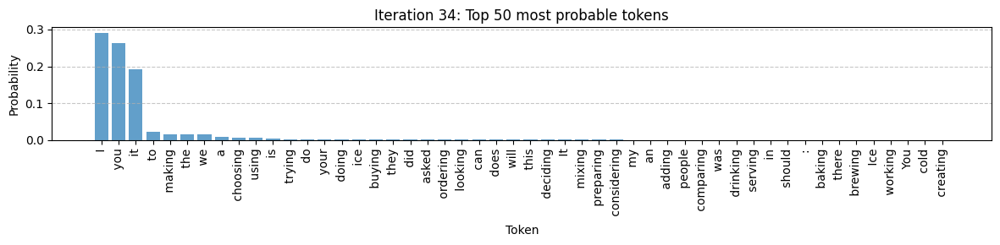

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When it


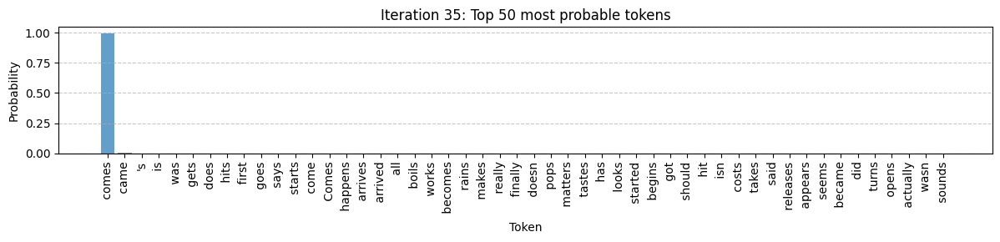

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When it comes


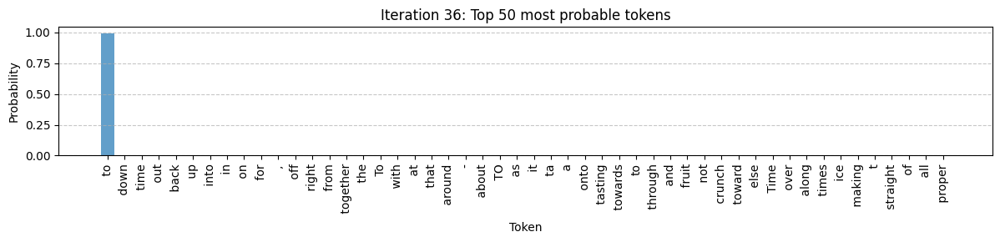

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When it comes to


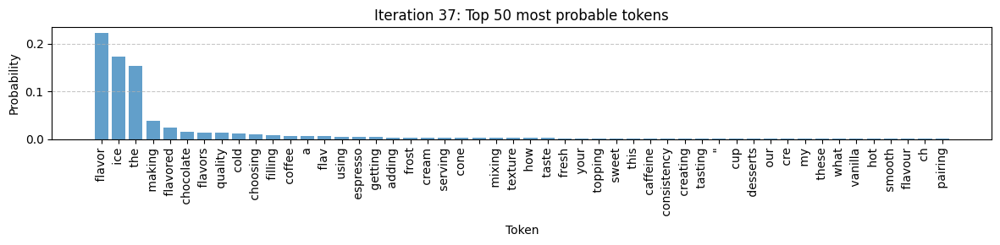

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When it comes to flavors


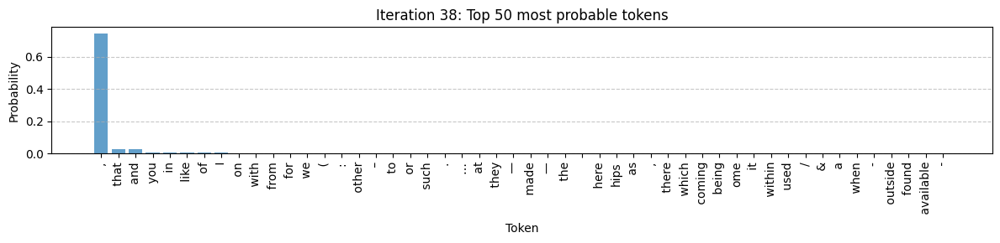

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When it comes to flavors on


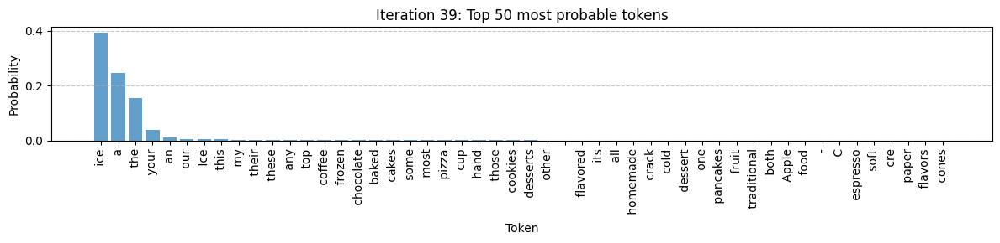

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When it comes to flavors on ice


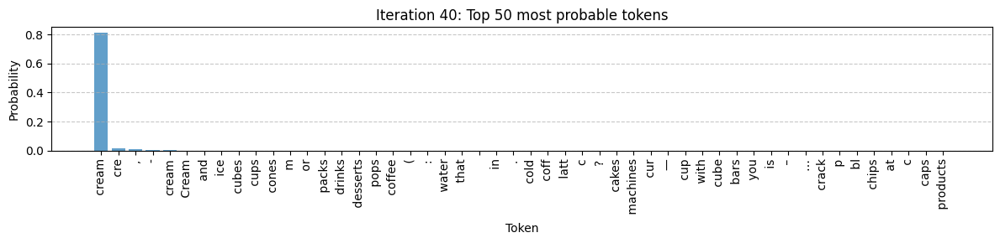

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When it comes to flavors on ice cream


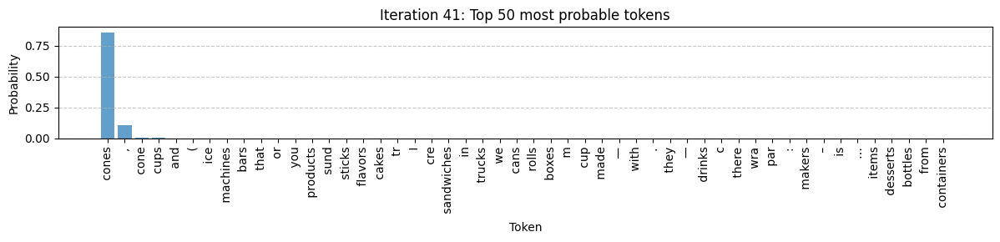

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When it comes to flavors on ice cream cones


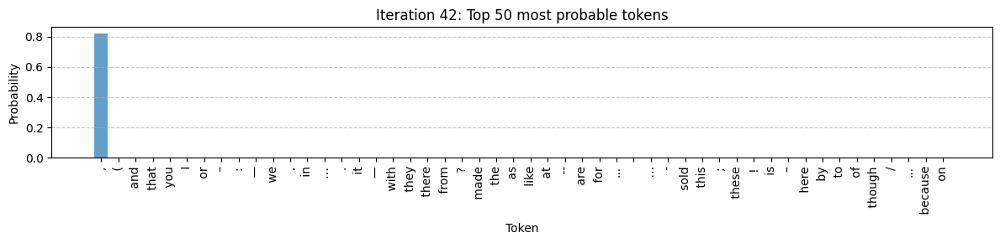

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When it comes to flavors on ice cream cones,


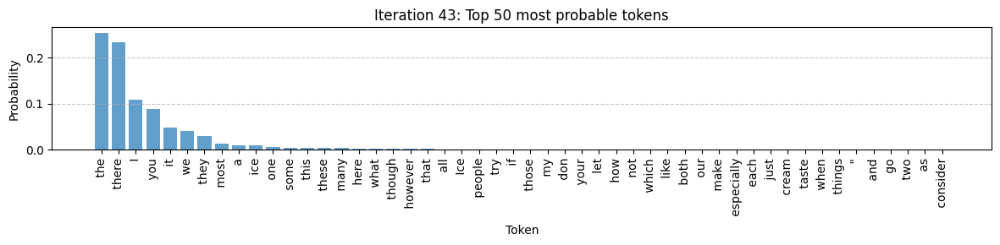

Generated so far: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When it comes to flavors on ice cream cones, there
Input text: Pancakes are good for ...
**Final generated text: Pancakes are good for iced coffee. But, if you're not interested in the flavor profile of an ice cream cone, then you probably don't like it as much.

When it comes to flavors on ice cream cones, there


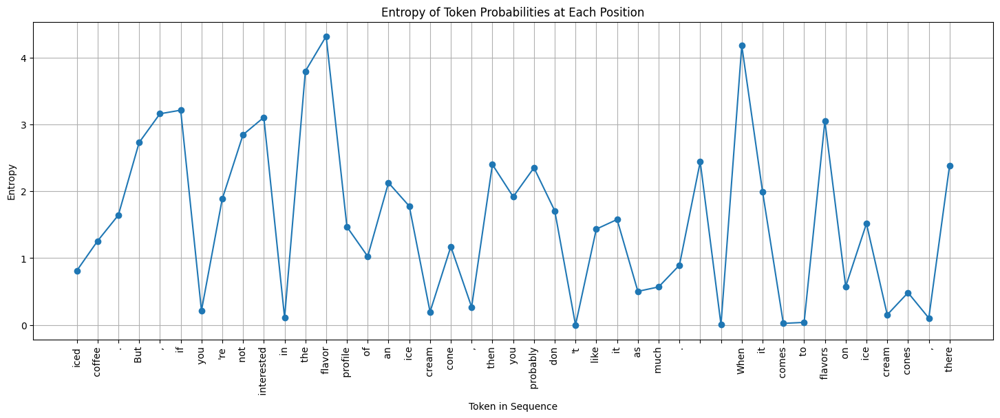

List of tokens with their positions in the sequence:
Position 7: iced
Position 8:  coffee
Position 9: .
Position 10:  But
Position 11: ,
Position 12:  if
Position 13:  you
Position 14: 're
Position 15:  not
Position 16:  interested
Position 17:  in
Position 18:  the
Position 19:  flavor
Position 20:  profile
Position 21:  of
Position 22:  an
Position 23:  ice
Position 24:  cream
Position 25:  cone
Position 26: ,
Position 27:  then
Position 28:  you
Position 29:  probably
Position 30:  don
Position 31: 't
Position 32:  like
Position 33:  it
Position 34:  as
Position 35:  much
Position 36: .
Position 37: 

Position 38: 

Position 39: When
Position 40:  it
Position 41:  comes
Position 42:  to
Position 43:  flavors
Position 44:  on
Position 45:  ice
Position 46:  cream
Position 47:  cones
Position 48: ,
Position 49:  there


In [41]:
# @title
input_text = "Pancakes are good for "
input_ids = tokenizer.encode(input_text, return_tensors="pt")

# Parameters for generation
max_length = 50
top_k = 50
top_p = 0.95
temperature = 0.7
repetition_penalty = 1.2

# Initialize attention mask
attention_mask = torch.ones(input_ids.shape, dtype=torch.long)

# Initialize variables for entropy calculation
entropy_values = []
generated_tokens_with_positions = []

# Generate tokens one by one
output_ids = input_ids
generated_tokens = tokenizer.convert_ids_to_tokens(output_ids[0])

# Loop to generate tokens
for iteration in range(max_length - input_ids.size(1)):
    with torch.no_grad():
        outputs = model(output_ids, attention_mask=attention_mask)

    # Get the logits for the last token
    logits = outputs.logits[:, -1, :]  # Shape: [batch_size, vocab_size]

    # Apply temperature scaling
    logits = logits / temperature

    # Convert logits to probabilities
    probs = torch.softmax(logits, dim=-1)

    # Calculate entropy
    entropy = -torch.sum(probs * torch.log(probs + 1e-12), dim=-1).item()
    entropy_values.append(entropy)

    # Apply repetition penalty
    if len(output_ids[0]) > 1:
        for token_id in set(output_ids[0].tolist()):
            probs[0, token_id] /= repetition_penalty

    # Sample from the probability distribution
    next_token_id = torch.multinomial(probs, num_samples=1)

    # Append the next token to the input_ids
    output_ids = torch.cat([output_ids, next_token_id], dim=-1)
    attention_mask = torch.ones(output_ids.shape, dtype=torch.long)  # Update attention mask

    # Decode the current token
    current_token = tokenizer.decode([next_token_id.item()])
    generated_tokens_with_positions.append((len(output_ids[0])-1, current_token))

    # Add the generated token to the list of tokens
    generated_tokens.append(current_token)

    # Extract the top 50 probabilities and their indices
    top_probs, top_indices = torch.topk(probs, 50)
    top_probs_np = top_probs.cpu().numpy().flatten()
    top_indices_np = top_indices.cpu().numpy().flatten()
    top_tokens = [tokenizer.decode([idx]) for idx in top_indices_np]

    # Plotting top probabilities
    plt.figure(figsize=(12, 3))
    plt.bar(np.arange(50), top_probs_np, alpha=0.7)
    plt.xlabel('Token')
    plt.ylabel('Probability')
    plt.title(f'Iteration {iteration+1}: Top 50 most probable tokens')
    plt.xticks(np.arange(50), top_tokens, rotation='vertical')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Decode the current state of the sequence
    current_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
    print(f"Generated so far: {current_text}")

# Final generated text
final_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
print(f"Input text: {input_text}...")
print(f"**Final generated text: {final_text}")

# Align the length of generated tokens with entropy values
entropy_tokens = generated_tokens[len(generated_tokens) - len(entropy_values):]

# Plot the entropy values
plt.figure(figsize=(18, 6))
plt.plot(range(1, len(entropy_values) + 1), entropy_values, marker='o')
plt.xticks(range(1, len(entropy_values) + 1), entropy_tokens, rotation='vertical')  # Use tokens for x-axis labels
plt.xlabel('Token in Sequence')
plt.ylabel('Entropy')
plt.title('Entropy of Token Probabilities at Each Position')
plt.grid(True)
plt.show()

# Print the list of tokens with their positions
print("List of tokens with their positions in the sequence:")
for position, token in generated_tokens_with_positions:
    print(f"Position {position}: {token}")


**CALCULATING THE ENTROPY FOR EACH GENERATED TOEKEN FOR DIFFERENT TEMPERATURES**

Uniform entropy: 10.82490511970208


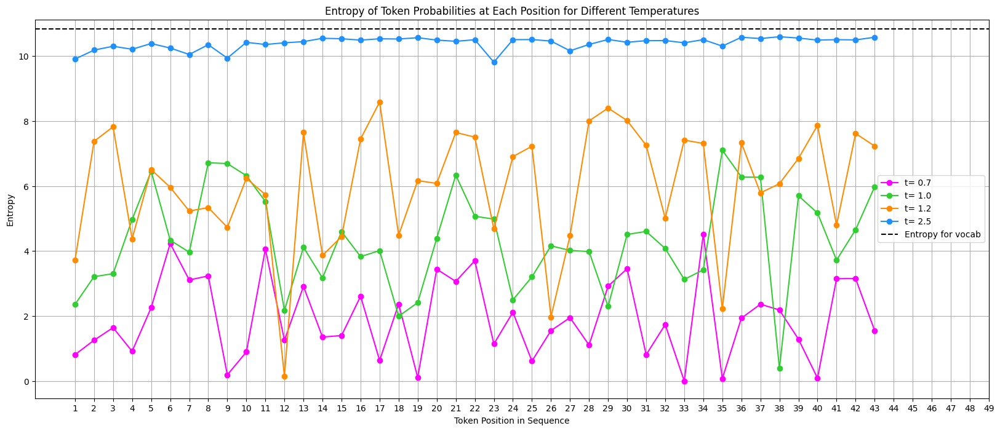

List of tokens with their positions in the sequence for temperature=2.5 evaluated (just for a reference of the position in the period):
Position 7:  fancy
Position 8:  today
Position 9:  brands
Position 10: ß
Position 11:  Pork
Position 12:  crack
Position 13: ..
Position 14:  you
Position 15: Music
Position 16: 652
Position 17:  Else
Position 18:  outdoors
Position 19: itaire
Position 20: ffect
Position 21: em
Position 22: berman
Position 23:  Management
Position 24: gaming
Position 25:  Light
Position 26:  Cream
Position 27:  DI
Position 28: Whe
Position 29: 770
Position 30:  Dad
Position 31: ol
Position 32:  Posts
Position 33:  pending
Position 34:  Packs
Position 35:  reached
Position 36:  Former
Position 37: AAAA
Position 38: VD
Position 39:  Timeline
Position 40:  w
Position 41:  liquidity
Position 42:  fi
Position 43: ords
Position 44: around
Position 45: graph
Position 46:  Gideon
Position 47:  Colombia
Position 48:  inspired
Position 49:  Destination


In [51]:
input_text = "Pancakes are good for "
input_ids = tokenizer.encode(input_text, return_tensors="pt")

# Parameters for generation
max_length = 50
top_k = 50
top_p = 0.95
repetition_penalty = 1.1
temperatures = [0.7, 1.0, 1.2, 2.5]
colors = ['fuchsia', 'limegreen', 'darkorange', 'dodgerblue']

# Calculate entropy for a uniform distribution over the whole vocabulary (V=50257)
vocab_size = 50257
uniform_entropy = math.log(vocab_size)
print(f"Uniform entropy: {uniform_entropy}")

temperature_entropy_dict = {}

for temperature in temperatures:
    # Initialize variables for entropy calculation
    entropy_values = []
    generated_tokens_with_positions = []

    # Generate tokens one by one
    output_ids = input_ids
    generated_tokens = tokenizer.convert_ids_to_tokens(output_ids[0])

    # Loop to generate tokens
    for iteration in range(max_length - input_ids.size(1)):
        attention_mask = torch.ones(output_ids.shape, dtype=torch.long)  # Update attention mask
        with torch.no_grad():
            outputs = model(output_ids, attention_mask=attention_mask)

        # Get the logits for the last token
        logits = outputs.logits[:, -1, :]  # Shape: [batch_size, vocab_size]

        # Apply temperature scaling
        logits = logits / temperature

        # Convert logits to probabilities
        probs = torch.softmax(logits, dim=-1)

        # Calculate entropy
        entropy = -torch.sum(probs * torch.log(probs + 1e-12), dim=-1).item()
        entropy_values.append(entropy)

        # Apply repetition penalty
        if len(output_ids[0]) > 1:
            for token_id in set(output_ids[0].tolist()):
                probs[0, token_id] /= repetition_penalty

        # Sample from the probability distribution
        next_token_id = torch.multinomial(probs, num_samples=1)

        # Append the next token to the input_ids
        output_ids = torch.cat([output_ids, next_token_id], dim=-1)

        # Decode the current token
        current_token = tokenizer.decode([next_token_id.item()])
        generated_tokens_with_positions.append((len(output_ids[0])-1, current_token))

        # Add the generated token to the list of tokens
        generated_tokens.append(current_token)

    # Store entropies for this temperature
    temperature_entropy_dict[temperature] = (entropy_values, generated_tokens[len(generated_tokens) - len(entropy_values):])

plt.figure(figsize=(20, 8))

for i, (temperature, (entropy_values, _)) in enumerate(temperature_entropy_dict.items()):
    plt.plot(range(1, len(entropy_values) + 1), entropy_values, marker='o', label=f't= {temperature}', color=colors[i])

plt.axhline(y=uniform_entropy, color='black', linestyle='--', label=f'Entropy for vocab')

plt.xticks(range(1, max_length))  # Use token positions as x-axis labels

plt.xlabel('Token Position in Sequence')
plt.ylabel('Entropy')
plt.title('Entropy of Token Probabilities at Each Position for Different Temperatures')
plt.legend(loc='center right')
plt.grid(True)
plt.show()

print("List of tokens with their positions in the sequence for temperature=2.5 evaluated (just for a reference of the position in the period):")
for position, token in generated_tokens_with_positions:
    print(f"Position {position}: {token}")


**High Temperature:**
Higher values make the model's output more random and creative.
The probability distribution is flattened, making it more likely for the model to choose less probable words.
This can lead to more diverse and unexpected outputs but can also result in incoherent or nonsensical text.

**Low Temperature:**
Lower values make the output more deterministic and focused.
The probability distribution becomes sharper, making it more likely for the model to choose the highest probability words.
This results in more predictable and repetitive text, often sticking to the safest or most likely choices.

**CACLULATING THE ENTROPY FOR EACH GENERATED TOKEN FOR DIFFERENT REPETITION PENALTY VALUES**

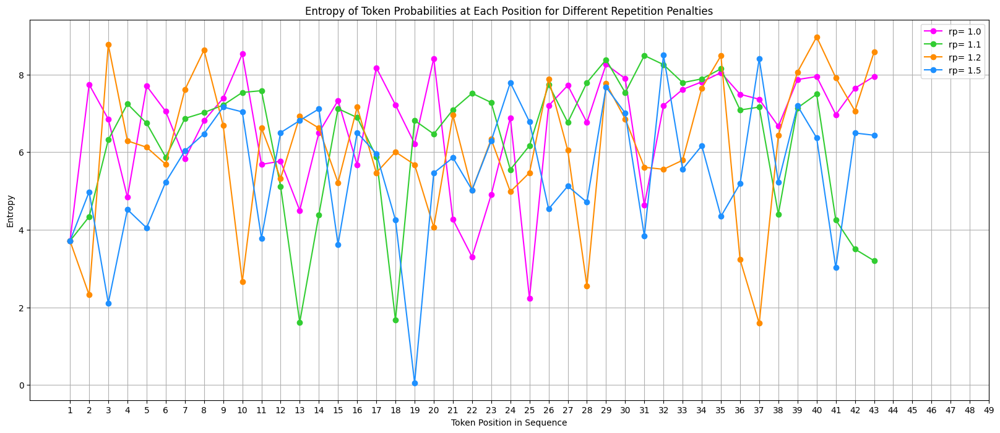

In [ ]:
input_text = "Pancakes are good for "
input_ids = tokenizer.encode(input_text, return_tensors="pt")

# Parameters for generation
max_length = 50
temperature = 1.2
repetition_penalties = [1.0, 1.1, 1.2, 1.5]
colors = ['fuchsia', 'limegreen', 'darkorange', 'dodgerblue']

repetition_penalty_entropy_dict = {}

for repetition_penalty in repetition_penalties:
    # Initialize variables for entropy calculation
    entropy_values = []
    generated_tokens_with_positions = []

    # Generate tokens one by one
    output_ids = input_ids
    generated_tokens = tokenizer.convert_ids_to_tokens(output_ids[0])

    # Loop to generate tokens
    for iteration in range(max_length - input_ids.size(1)):
        attention_mask = torch.ones(output_ids.shape, dtype=torch.long)  # Update attention mask
        with torch.no_grad():
            outputs = model(output_ids, attention_mask=attention_mask)

        # Get the logits for the last token
        logits = outputs.logits[:, -1, :]  # Shape: [batch_size, vocab_size]

        # Apply temperature scaling
        logits = logits / temperature

        # Convert logits to probabilities
        probs = torch.softmax(logits, dim=-1)

        # Calculate entropy
        entropy = -torch.sum(probs * torch.log(probs + 1e-12), dim=-1).item()
        entropy_values.append(entropy)

        # Apply repetition penalty
        if len(output_ids[0]) > 1:
            for token_id in set(output_ids[0].tolist()):
                probs[0, token_id] /= repetition_penalty

        # Sample from the probability distribution
        next_token_id = torch.multinomial(probs, num_samples=1)

        # Append the next token to the input_ids
        output_ids = torch.cat([output_ids, next_token_id], dim=-1)

        # Decode the current token
        current_token = tokenizer.decode([next_token_id.item()])
        generated_tokens_with_positions.append((len(output_ids[0])-1, current_token))

        # Add the generated token to the list of tokens
        generated_tokens.append(current_token)



    # Store entropies for this repetition penalty
    repetition_penalty_entropy_dict[repetition_penalty] = (entropy_values, generated_tokens[len(generated_tokens) - len(entropy_values):])


plt.figure(figsize=(20, 8))

for i, (repetition_penalty, (entropy_values, _)) in enumerate(repetition_penalty_entropy_dict.items()):
    plt.plot(range(1, len(entropy_values) + 1), entropy_values, marker='o', label=f'rp= {repetition_penalty}', color=colors[i])

plt.xticks(range(1, max_length))  # Use token positions as x-axis labels

plt.xlabel('Token Position in Sequence')
plt.ylabel('Entropy')
plt.title('Entropy of Token Probabilities at Each Position for Different Repetition Penalties')
plt.legend(loc='best')
plt.grid(True)
plt.show()

print("List of tokens with their positions in the sequence for the last repetition penalty evaluated:")
for position, token in generated_tokens_with_positions:
    print(f"Position {position}: {token}")


***FOR A SPECIFIC PROMPT*: FIDING THE ENTROPY AND PROBABILITY OF EACH TOKEN GENERATED ACCORDINGLY**

(((not that insightful)))

<ipython-input-50-bab91deae7f1>:77: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


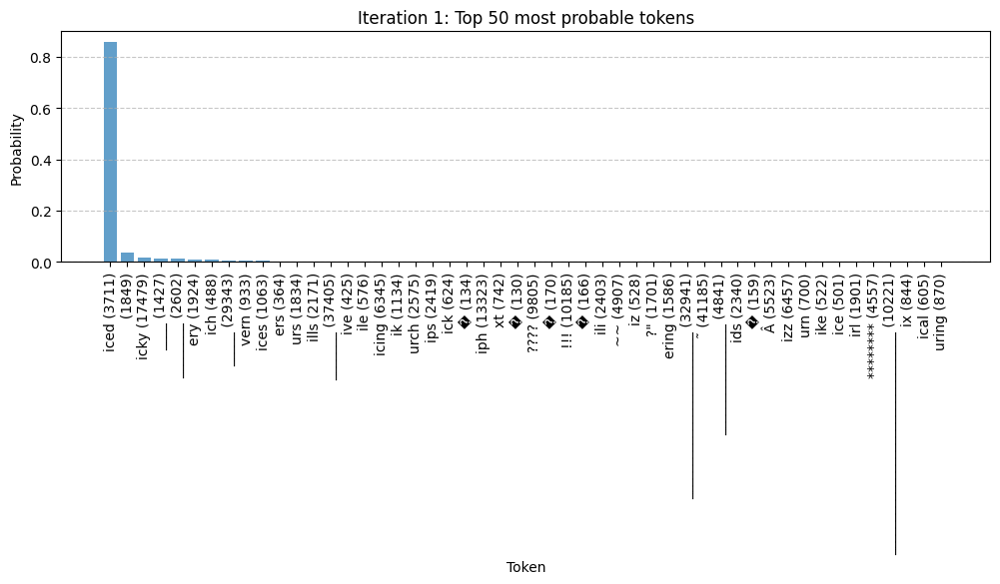

Generated so far: Pancakes are good for iced


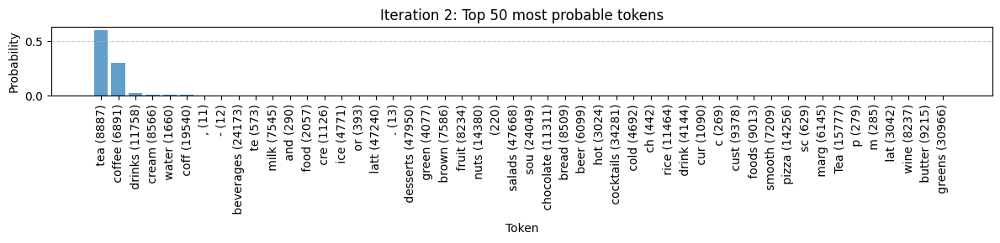

Generated so far: Pancakes are good for iced tea


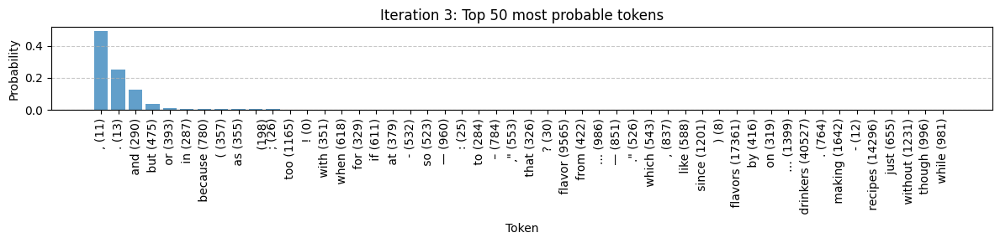

Generated so far: Pancakes are good for iced tea but


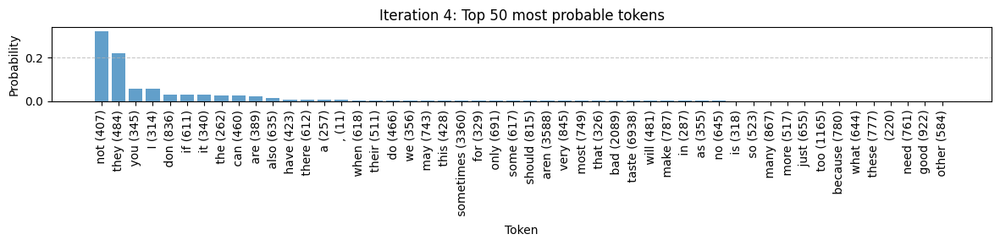

Generated so far: Pancakes are good for iced tea but not


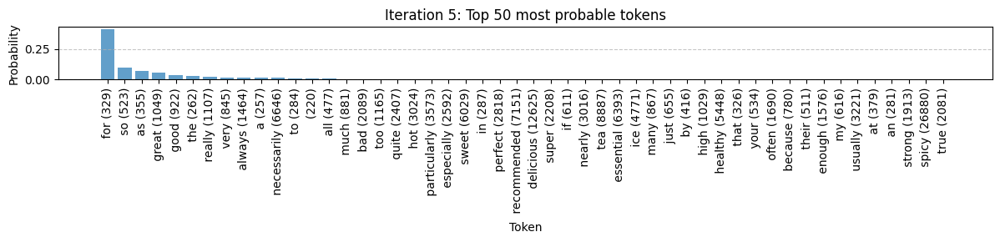

Generated so far: Pancakes are good for iced tea but not for


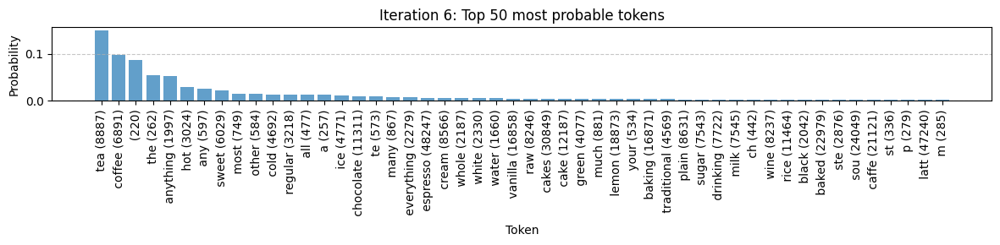

Generated so far: Pancakes are good for iced tea but not for a


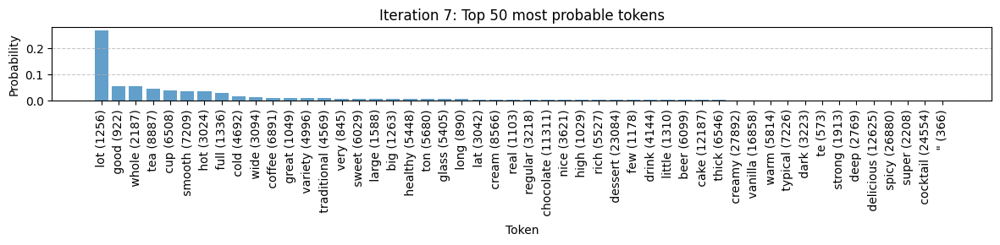

Generated so far: Pancakes are good for iced tea but not for a creamy


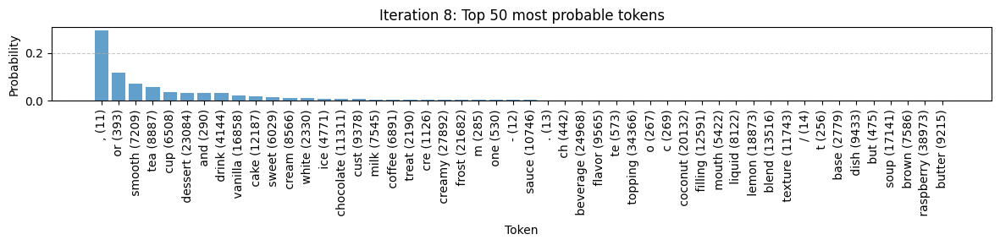

Generated so far: Pancakes are good for iced tea but not for a creamy white


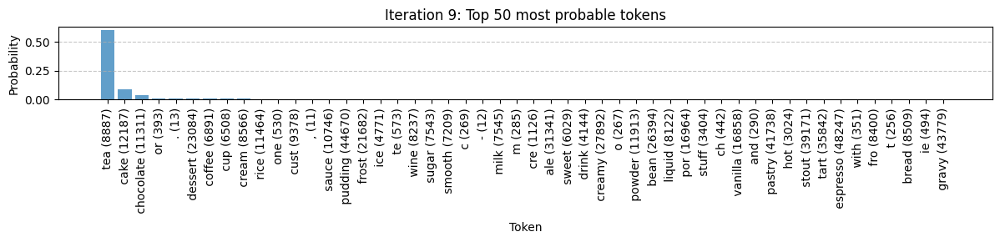

Generated so far: Pancakes are good for iced tea but not for a creamy white tea


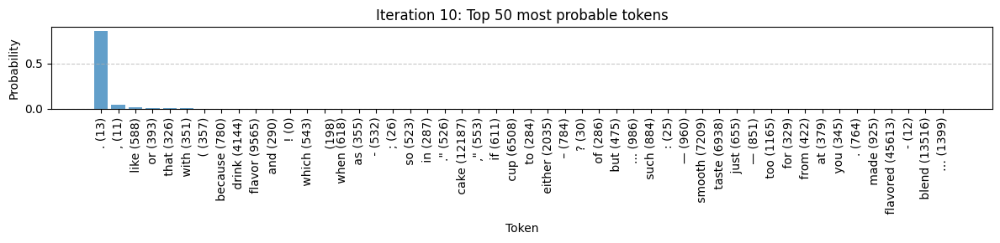

Generated so far: Pancakes are good for iced tea but not for a creamy white tea,


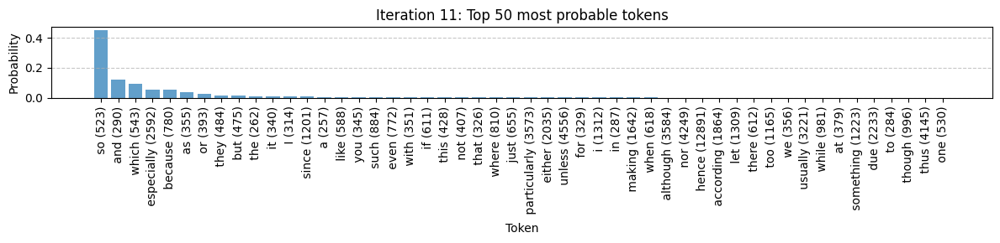

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because


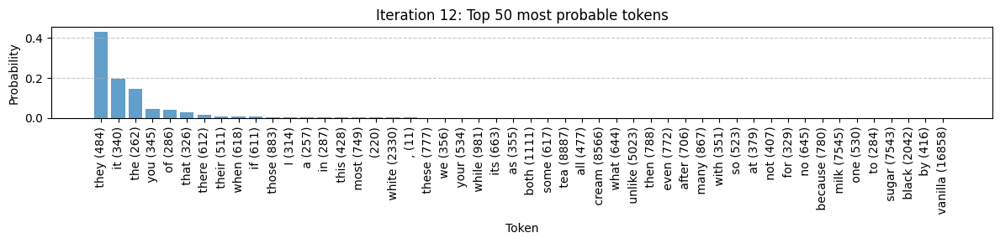

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you


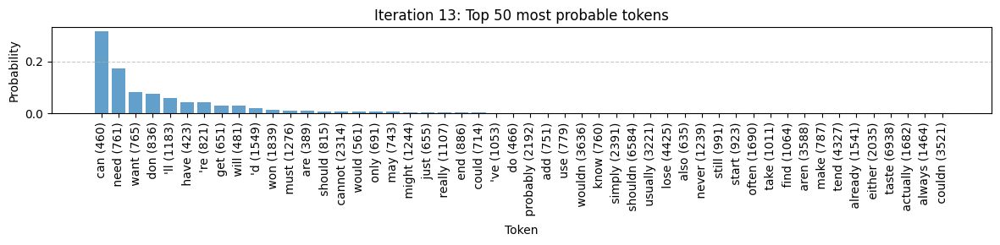

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have


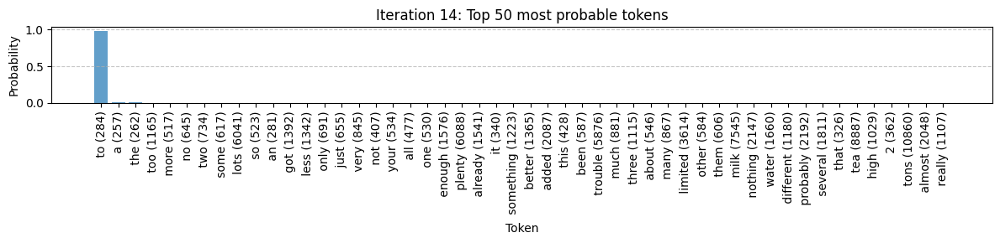

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to


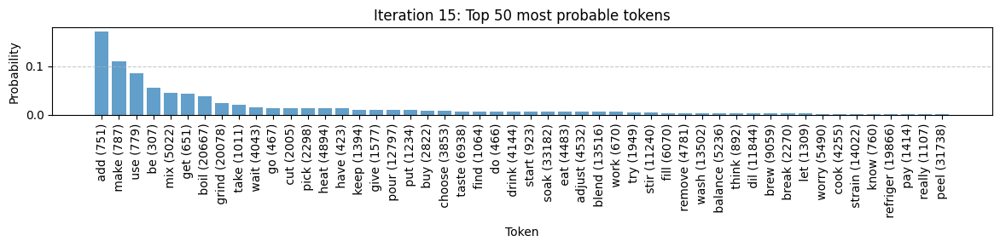

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix


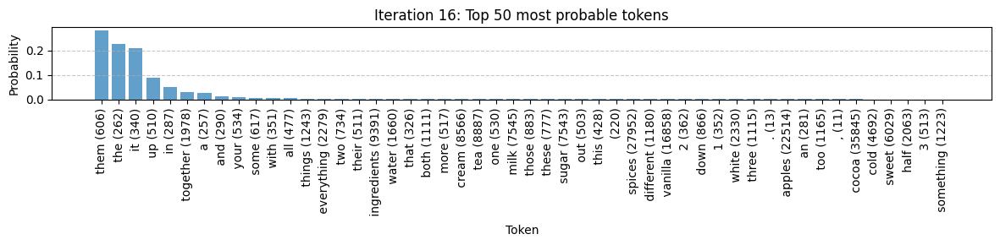

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them


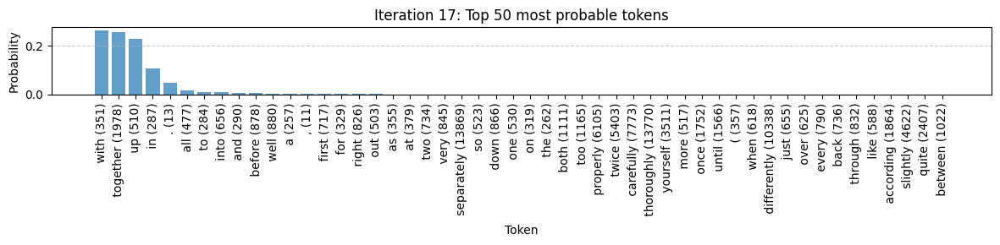

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.


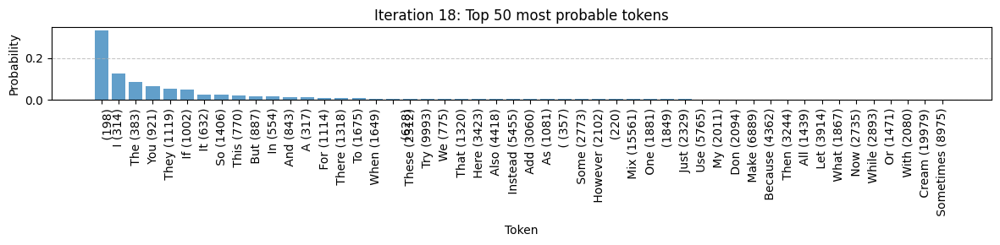

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.



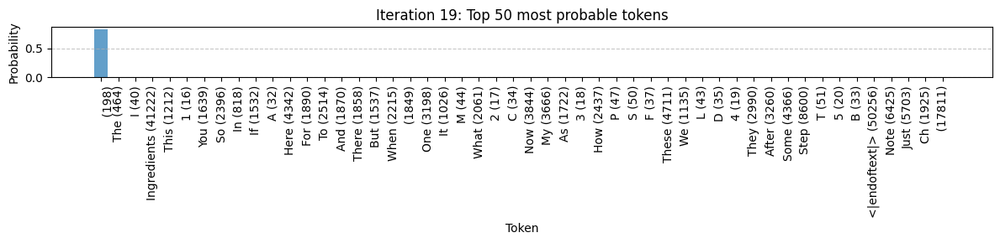

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.




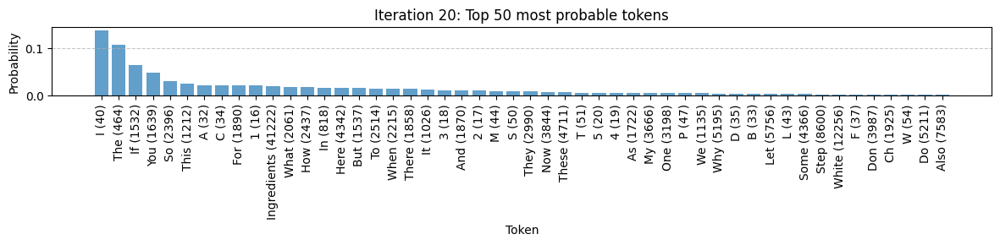

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I


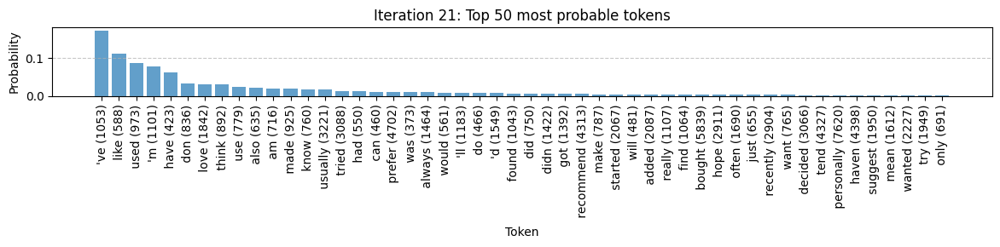

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made


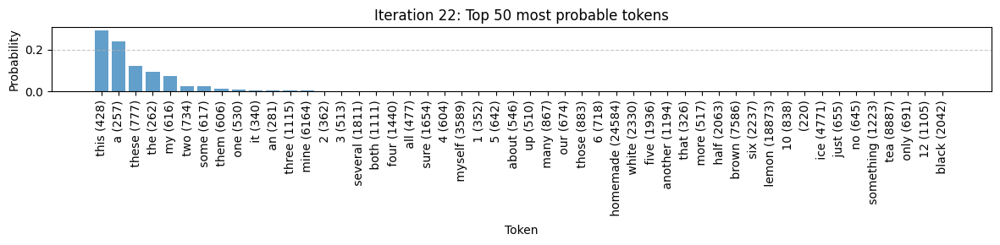

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the


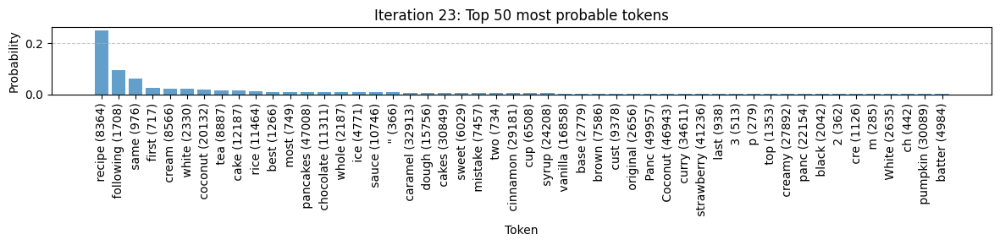

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the sc


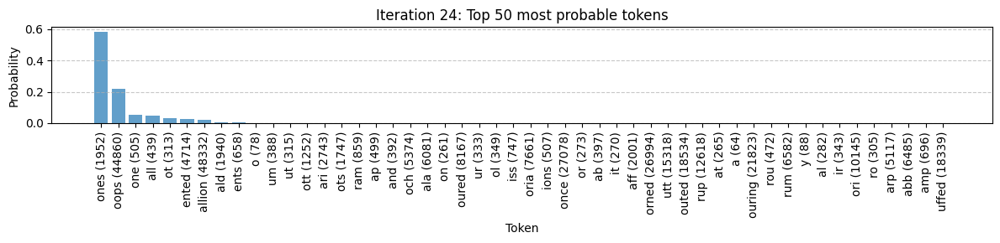

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones


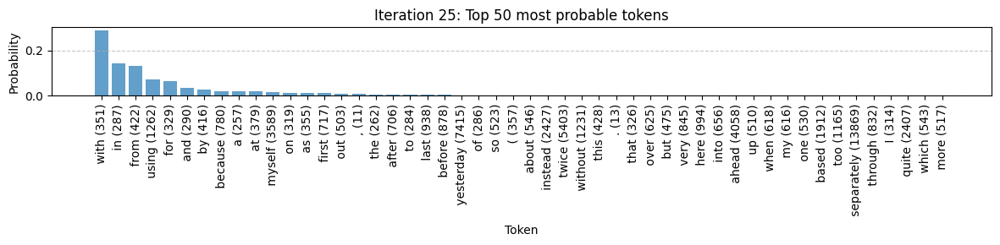

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well


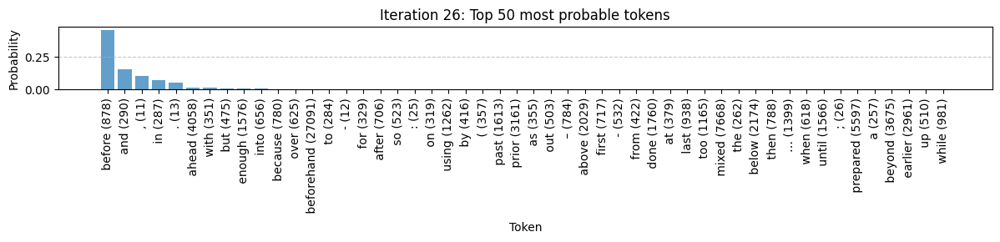

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and


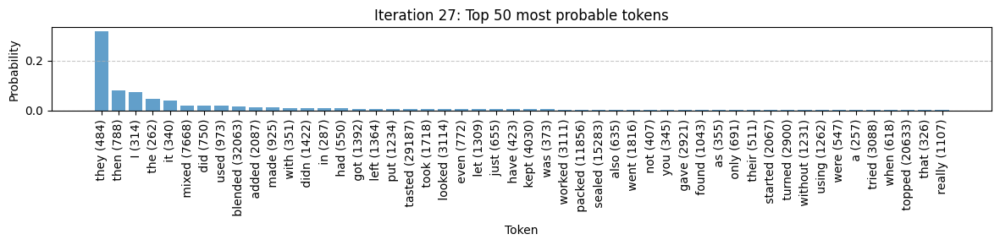

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was


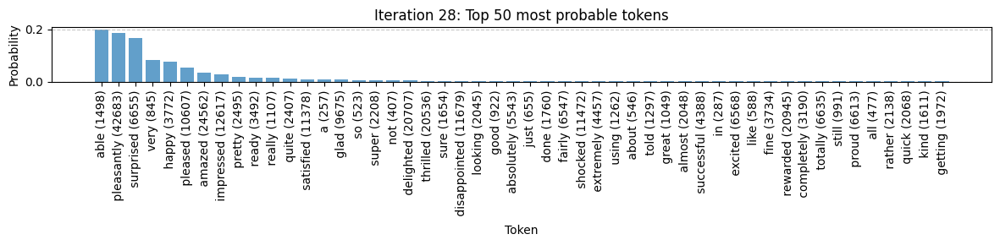

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded


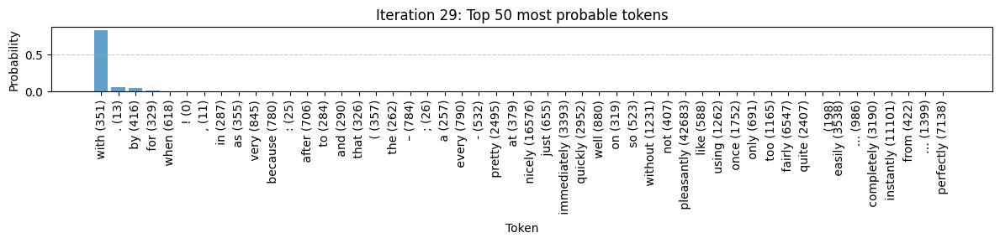

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with


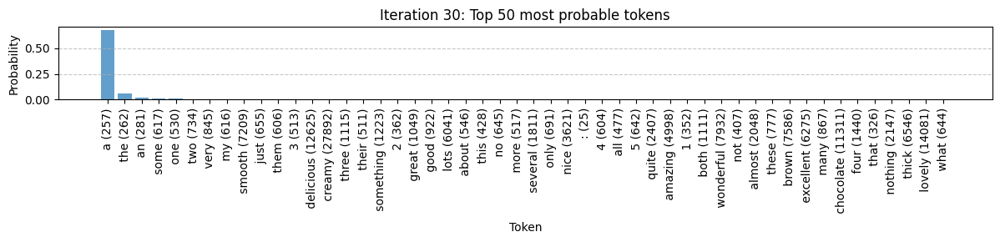

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a


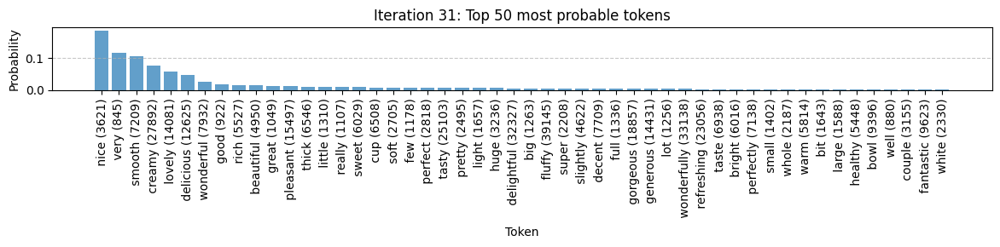

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice


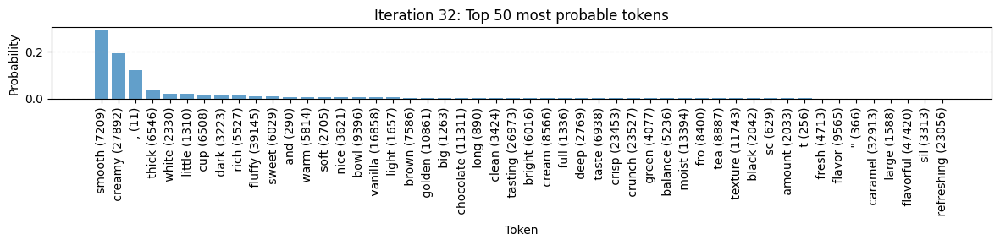

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice,


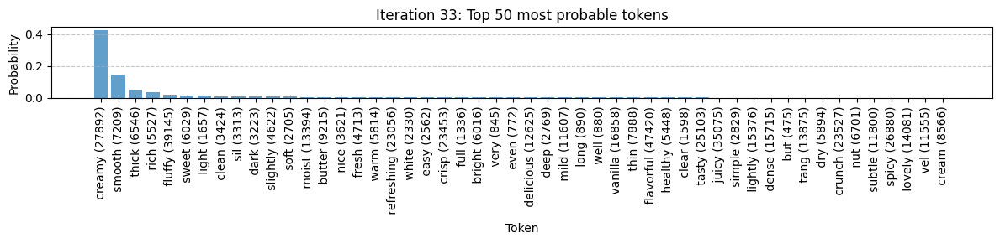

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy


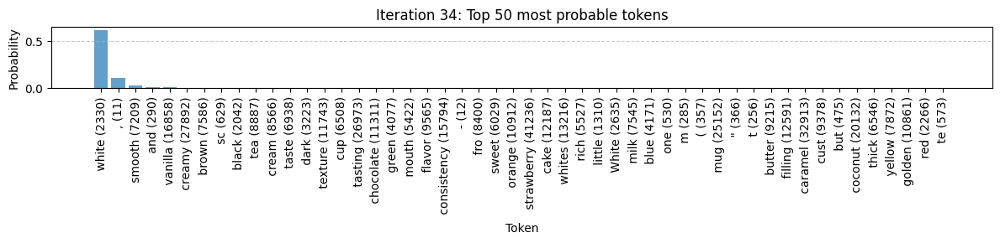

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy,


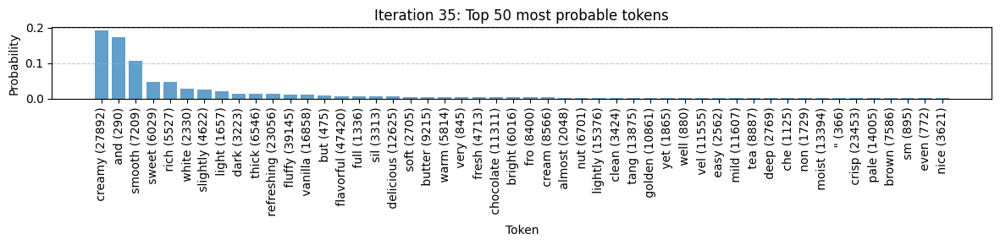

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy, white


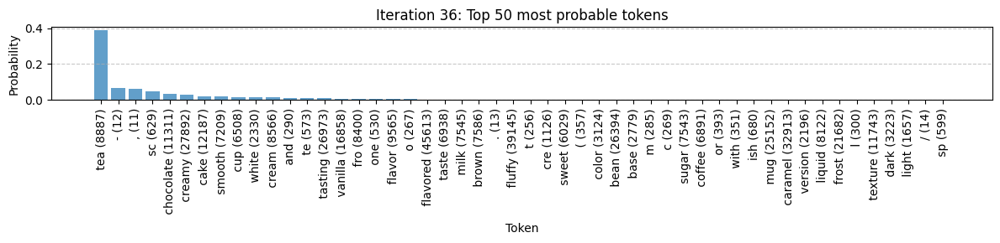

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy, white tea


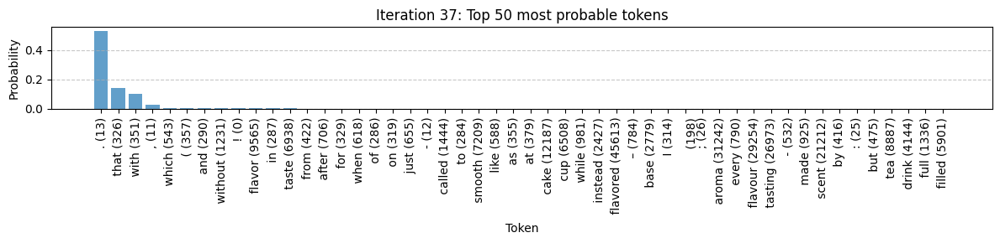

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy, white tea.


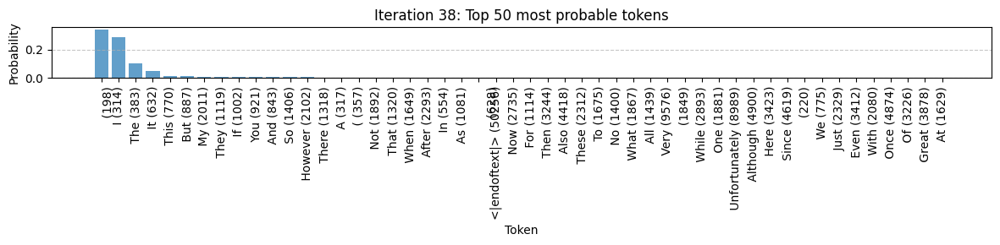

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy, white tea. I


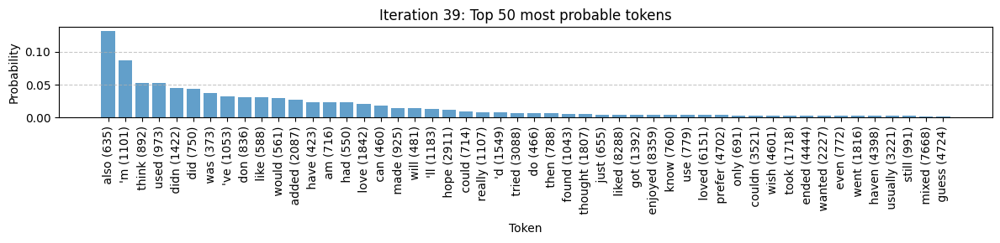

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy, white tea. I'm


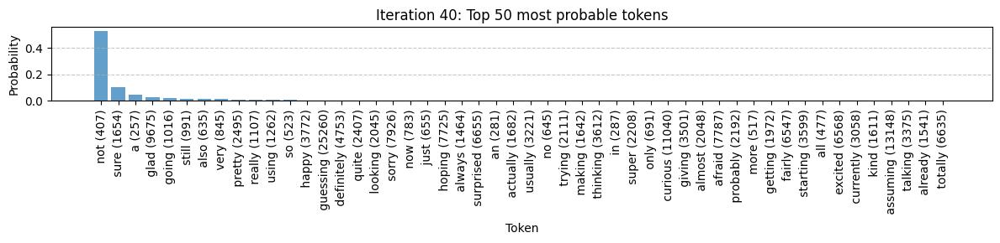

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy, white tea. I'm told


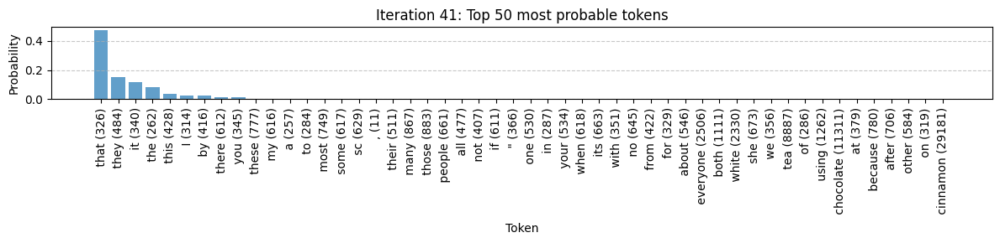

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy, white tea. I'm told they


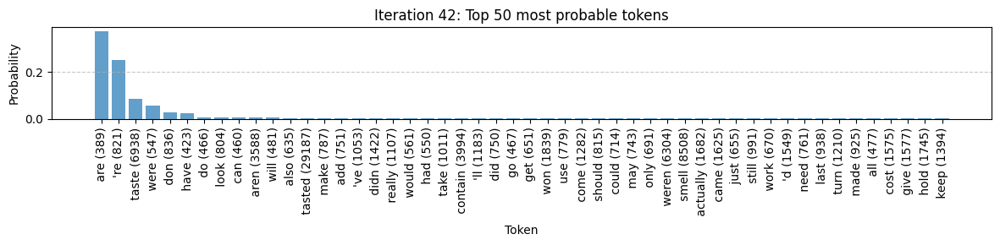

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy, white tea. I'm told they are


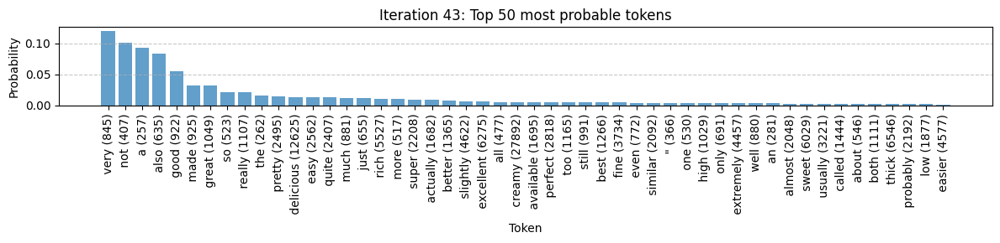

Generated so far: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy, white tea. I'm told they are treated
Input text: Pancakes are good for ...
**Final generated text: Pancakes are good for iced tea but not for a creamy white tea, because you have to mix them.

I made the scones well and was rewarded with a nice, creamy, white tea. I'm told they are treated


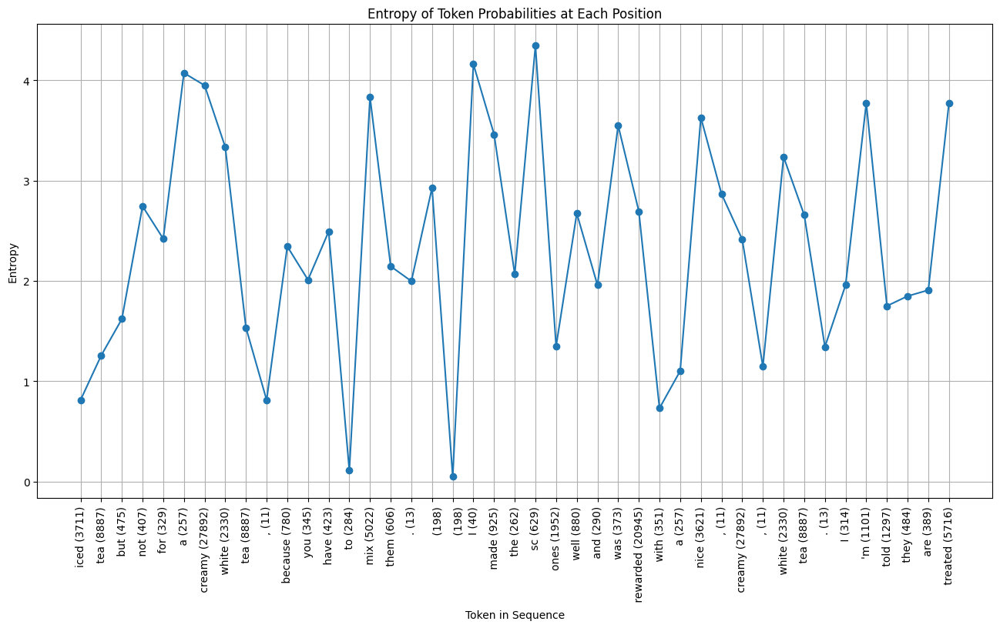

List of tokens with their positions in the sequence:
Position 7: iced (3711)
Position 8:  tea (8887)
Position 9:  but (475)
Position 10:  not (407)
Position 11:  for (329)
Position 12:  a (257)
Position 13:  creamy (27892)
Position 14:  white (2330)
Position 15:  tea (8887)
Position 16: , (11)
Position 17:  because (780)
Position 18:  you (345)
Position 19:  have (423)
Position 20:  to (284)
Position 21:  mix (5022)
Position 22:  them (606)
Position 23: . (13)
Position 24: 
 (198)
Position 25: 
 (198)
Position 26: I (40)
Position 27:  made (925)
Position 28:  the (262)
Position 29:  sc (629)
Position 30: ones (1952)
Position 31:  well (880)
Position 32:  and (290)
Position 33:  was (373)
Position 34:  rewarded (20945)
Position 35:  with (351)
Position 36:  a (257)
Position 37:  nice (3621)
Position 38: , (11)
Position 39:  creamy (27892)
Position 40: , (11)
Position 41:  white (2330)
Position 42:  tea (8887)
Position 43: . (13)
Position 44:  I (314)
Position 45: 'm (1101)
Position 46: 

In [50]:
import torch
import matplotlib.pyplot as plt
import numpy as np

input_text = "Pancakes are good for "
input_ids = tokenizer.encode(input_text, return_tensors="pt")

# Parameters for generation
max_length = 50
top_k = 50
top_p = 0.95
temperature = 0.7
repetition_penalty = 1.2

# Initialize attention mask
attention_mask = torch.ones(input_ids.shape, dtype=torch.long)

# Initialize variables for entropy calculation
entropy_values = []
generated_tokens_with_positions = []

# Generate tokens one by one
output_ids = input_ids
generated_tokens = tokenizer.convert_ids_to_tokens(output_ids[0])

# Loop to generate tokens
for iteration in range(max_length - input_ids.size(1)):
    with torch.no_grad():
        outputs = model(output_ids, attention_mask=attention_mask)

    # Get the logits for the last token
    logits = outputs.logits[:, -1, :]  # Shape: [batch_size, vocab_size]

    # Apply temperature scaling
    logits = logits / temperature

    # Convert logits to probabilities
    probs = torch.softmax(logits, dim=-1)

    # Calculate entropy
    entropy = -torch.sum(probs * torch.log(probs + 1e-12), dim=-1).item()
    entropy_values.append(entropy)

    # Apply repetition penalty
    if len(output_ids[0]) > 1:
        for token_id in set(output_ids[0].tolist()):
            probs[0, token_id] /= repetition_penalty

    # Sample from the probability distribution
    next_token_id = torch.multinomial(probs, num_samples=1)

    # Append the next token to the input_ids
    output_ids = torch.cat([output_ids, next_token_id], dim=-1)
    attention_mask = torch.ones(output_ids.shape, dtype=torch.long)  # Update attention mask

    # Decode the current token
    current_token = tokenizer.decode([next_token_id.item()])
    generated_tokens_with_positions.append((len(output_ids[0]) - 1, current_token, next_token_id.item()))

    # Add the generated token to the list of tokens
    generated_tokens.append(current_token)

    # Extract the top 50 probabilities and their indices
    top_probs, top_indices = torch.topk(probs, 50)
    top_probs_np = top_probs.cpu().numpy().flatten()
    top_indices_np = top_indices.cpu().numpy().flatten()
    top_tokens = [f'{tokenizer.decode([idx])} ({idx})' for idx in top_indices_np]

    # Plotting top probabilities
    plt.figure(figsize=(14, 3))
    plt.bar(np.arange(50), top_probs_np, alpha=0.7)
    plt.xlabel('Token')
    plt.ylabel('Probability')
    plt.title(f'Iteration {iteration + 1}: Top 50 most probable tokens')
    plt.xticks(np.arange(50), top_tokens, rotation='vertical')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Decode the current state of the sequence
    current_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
    print(f"Generated so far: {current_text}")

    # Stop if the model generates an end-of-sequence token
    if next_token_id.item() == tokenizer.eos_token_id:
        break

# Final generated text
final_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
print(f"Input text: {input_text}...")
print(f"**Final generated text: {final_text}")

# Align the length of generated tokens with entropy values
entropy_tokens = generated_tokens[len(generated_tokens) - len(entropy_values):]

# Plot the entropy values
plt.figure(figsize=(16, 8))
plt.plot(range(1, len(entropy_values) + 1), entropy_values, marker='o')
entropy_labels = [f'{token} ({token_id})' for token, token_id in zip(entropy_tokens, [t[2] for t in generated_tokens_with_positions])]
plt.xticks(range(1, len(entropy_values) + 1), entropy_labels, rotation='vertical')  # Use tokens for x-axis labels
plt.xlabel('Token in Sequence')
plt.ylabel('Entropy')
plt.title('Entropy of Token Probabilities at Each Position')
plt.grid(True)
plt.show()

# Print the list of tokens with their positions
print("List of tokens with their positions in the sequence:")
for position, token, token_id in generated_tokens_with_positions:
    print(f"Position {position}: {token} ({token_id})")


**NOTES**

-bias towards next token being a token already used

-entropy dash line confirms that the higher the entropy the more equiprobable the next tokens are in the distribution. because for the size of the whole vocabulary of 50257 tokens, the entropy is ln(V) = 10.82490511970208

-range repetition penalty doesnt really affect the entropy

-generation of first token in sequence has always the most options for being a character?? (smth not possible to be displayed by ASCII???)

-